# Cargar las librerias

Se cargan las siguientes librerias que se utilizarán en el proyecto:

In [ ]:
# Cargar las librerias de Python

import matplotlib.pyplot as plt # crear graficos https://matplotlib.org/
import seaborn as sns # para crear graficos parecido a ggplot2 de R  https://seaborn.pydata.org/examples/index.html
# para instalar plotly: pip install plotly
import plotly.express as px # para graficos interactivos https://plotly.com/python/

import numpy as np # manipulacion de vectores https://numpy.org/
import pandas as pd # manipulacion de dataframes igual R https://pandas.pydata.org/getting_started.html
import sklearn.model_selection as skm_s
import sklearn.metrics as skm

# Librerías estadísticas:
#-------------------------------------------------------------------------------------------------

import pingouin as pg # paquete estadístico para test estadísticos: ANOVA, Chi Square,...
import statsmodels.api as sm # paquete de modelos estadísticos muy potente


# Librerías machine learning:
#-------------------------------------------------------------------------------------------------
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report  # cálculo matriz de confusión
from sklearn.metrics import confusion_matrix # cálculo matriz de confusión
from sklearn.metrics import accuracy_score # acruracy
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier  # árbol de clasificación en sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.datasets import make_classification
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

import missingno as msno # visualizar los valors NAs

## Funciones

1. Función personalizada para ***buscar outliers*** (https://careerfoundry.com/en/blog/data-analytics/how-to-find-outliers/)

In [13]:
def find_outliers_IQR(df):
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    IQR = q3 - q1
    outliers = df[((df<(q1-1.5*IQR))) | (df>(q3+1.5*IQR))]
    return outliers

2. Función para ***ver todas las filas de un dataframe***.

In [14]:
pd.set_option("display.max_rows",None) # mostrar todas las filas del dataframe

In [14]:
#eliminar los N/As
data = data.dropna()

# Lectura/importación de datos

En este ejemplo se trabaja con los datos de la siguiente url: https://www.kaggle.com/datasets/fedesoriano/stroke-prediction-dataset

Las variables representadas en el dataset son las siguientes:

- id: unique identifier
- gender: "Male", "Female" or "Other"
- age: age of the patient
- hypertension: 0 if the patient doesn't have hypertension, 1 if the patient has hypertension
- heart_disease: 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease
- ever_married: "No" or "Yes"
- work_type: "children", "Govt_jov", "Never_worked", "Private" or "Self-employed"
- Residence_type: "Rural" or "Urban"
- avg_glucose_level: average glucose level in blood
- bmi: body mass index
- smoking_status: "formerly smoked", "never smoked", "smokes" or "Unknown"*
- stroke: 1 if the patient had a stroke or 0 if not
Note: "Unknown" in smoking_status means that the information is unavailable for this patient

La idea del proyecto es poder predecir las probabilidades de que tenga stroke un nuevo paciente de esta manera poder prevenir este evento tan complicado a nivel de salud.

Para la lectura e importación de datos se utiliza a continuación la libreria pandas.

1. Se **busca el directorio** de la base de datos, es decir, donde se encuentra. Para el
siguiente ejemplo, el directorio es: C:\Users\valer\PYTHON\Ejemplo_paso_paso_stroke\datos.
Sin embargo, si se corriese este directorio, entonces este arrojará un error dado que se deben
cambiar los \s.
Para realizar este cambio se debe realizar lo siguiente:

       Edit > Find (\) and Replace (/), se coloca respectivamente como sale en el parentesis

In [12]:
path_file = 'C:/Users/valer/PYTHON/Ejemplo_paso_paso_stroke/datos/healthcare-dataset-stroke.csv'

2. A continuación, para **importar el dataframe** se coloca entre parentesis su directorio, con cuáles 
simbolos está separado (en este caso con comas) y si tiene encabezado (header), se coloca 0 cuando 
la primera fila de la base de datos representa los encabezados del data frame.

In [13]:
data = pd.read_csv(path_file, sep=",", header = 0)

3. Para **visualizar el data frame** se llama a la función *data.head*. Entre parentesis se puede colocar 
 el numero de observaciones que se desea ver.

In [17]:
# 20 primeras filas
data.head(20)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,53882,Male,74.0,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,10434,Female,69.0,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,27419,Female,59.0,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,60491,Female,78.0,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [18]:
# 10 ultimas filas
data.tail(10)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
5100,68398,Male,82.0,1,0,Yes,Self-employed,Rural,71.97,28.3,never smoked,0
5101,36901,Female,45.0,0,0,Yes,Private,Urban,97.95,24.5,Unknown,0
5102,45010,Female,57.0,0,0,Yes,Private,Rural,77.93,21.7,never smoked,0
5103,22127,Female,18.0,0,0,No,Private,Urban,82.85,46.9,Unknown,0
5104,14180,Female,13.0,0,0,No,children,Rural,103.08,18.6,Unknown,0
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0
5109,44679,Female,44.0,0,0,Yes,Govt_job,Urban,85.28,26.2,Unknown,0


4. Para **obtener la información del dataframe** y el tipo de dato de cada una de las variables,
se utiliza *data.info*.

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


5. Para **obtener el numero de filas y columnas** (variables) se utiliza *len*.

In [20]:
print('Numero de filas:')
len(data)

Numero de filas:


5110

In [21]:
print('Numero de columnas:')
len(data.columns)

Numero de columnas:


12

6. Con *data.index* se puede **conocer el indice** (primer valor de la izquierda) **de cada observación**, 
desde que valor comienza hasta cual termina.

In [22]:
data.index

RangeIndex(start=0, stop=5110, step=1)

7. Con *data.columns* se puede conocer el **nombre de las columnas** (variables).

In [23]:
data.columns

Index(['id', 'gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')

8. Con *data.shape* se **conoce el numero de filas y columnas** del dataframe.

In [24]:
data.shape

(5110, 12)

9. De las variables cuantitativas, con la libreria pandas se puede realizar una **estadistica descriptiva** de estas utilizando 
el comando *data.describe()*.

In [25]:
data.describe()

,id,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,36517.829354,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,21161.721625,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,67.000000,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,17741.250000,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,36932.000000,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,54682.000000,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,72940.000000,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


10. A continuación, se crea un dataframe con las variables de la base de datos que se está utilizando.

In [26]:
pd.DataFrame(data.columns)

,0
0,id
1,gender
2,age
3,hypertension
4,heart_disease
5,ever_married
6,work_type
7,Residence_type
8,avg_glucose_level
9,bmi


11. Ahora, se crea un "encabezado" para la tabla anterior (se crea un dataframe a partir de un vector)

In [27]:
variables = pd.DataFrame(data.columns)

## se le da el nombre a la columna
variables.columns = ['Nombre_Variables']
variables

,Nombre_Variables
0,id
1,gender
2,age
3,hypertension
4,heart_disease
5,ever_married
6,work_type
7,Residence_type
8,avg_glucose_level
9,bmi


Se utiliza la libreria numpy.

1. Se **genera un vector** del 0 al 11 (numero de columnas) con *np.arange(len())*.

In [28]:
vec = np.arange(len(data.columns))
vec

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

2. Al dataframe creado anteriormente con pandas se le añade una columna, la cual representa el numero de columna (indice).

In [29]:
variables["Numero_columna"] = np.arange(len(data.columns))
variables

,Nombre_Variables,Numero_columna
0,id,0
1,gender,1
2,age,2
3,hypertension,3
4,heart_disease,4
5,ever_married,5
6,work_type,6
7,Residence_type,7
8,avg_glucose_level,8
9,bmi,9


## Ejemplo de lectura e importación de  datos

En el siguiente ejemplo, se importa el dataframe "Stroke" y se accede a una de sus variables, siendo esta la variable 
"gender".

In [30]:
data["gender"]

0         Male
1       Female
2         Male
3       Female
4       Female
5         Male
6         Male
7       Female
8       Female
9       Female
10      Female
11      Female
12      Female
13        Male
14      Female
15      Female
16        Male
17        Male
18      Female
19        Male
20      Female
21      Female
22      Female
23        Male
24        Male
25        Male
26      Female
27        Male
28        Male
29        Male
30        Male
31        Male
32      Female
33        Male
34        Male
35      Female
36        Male
37      Female
38        Male
39      Female
40        Male
41        Male
42        Male
43      Female
44        Male
45        Male
46      Female
47      Female
48        Male
49      Female
50      Female
51        Male
52      Female
53      Female
54      Female
55        Male
56      Female
57        Male
58        Male
59      Female
60      Female
61      Female
62      Female
63      Female
64        Male
65        Male
66      Fe

A continuación, se seleccionarán solamente la edad de las personas que tiene o hayan sufrido stroke (1).
Esto se realiza mediante la utilización de *.loc* (se encuentra dentro de la libreria pandas), el cual 
**permite seleccionar elementos mediante etiquetas** (o índces) **o declaraciones condicionales**.

1. Primero, se crea una variable llamada "vec_booleano" la cual estará comprendida por todas las observaciones que
tengan stroke igual a 1.

In [31]:
vec_booleano = data["stroke"]==1

2. Luego, se selecciona solamente las edades del dataframe que cumplan con la condición (tener stroke = 1).

In [32]:
data["age"].loc[vec_booleano]

0      67.00
1      61.00
2      80.00
3      49.00
4      79.00
5      81.00
6      74.00
7      69.00
8      59.00
9      78.00
10     81.00
11     61.00
12     54.00
13     78.00
14     79.00
15     50.00
16     64.00
17     75.00
18     60.00
19     57.00
20     71.00
21     52.00
22     79.00
23     82.00
24     71.00
25     80.00
26     65.00
27     58.00
28     69.00
29     59.00
30     57.00
31     42.00
32     82.00
33     80.00
34     48.00
35     82.00
36     74.00
37     72.00
38     58.00
39     49.00
40     78.00
41     54.00
42     82.00
43     63.00
44     60.00
45     76.00
46     75.00
47     58.00
48     81.00
49     39.00
50     76.00
51     78.00
52     79.00
53     77.00
54     63.00
55     63.00
56     82.00
57     78.00
58     73.00
59     54.00
60     56.00
61     80.00
62     67.00
63     45.00
64     75.00
65     78.00
66     70.00
67     76.00
68     59.00
69     80.00
70     76.00
71     67.00
72     66.00
73     63.00
74     52.00
75     80.00
76     80.00

3. Después, se calcula la edad promedio del segmento de grupo que tiene stroke igual a 1 y a 0.

In [33]:
data["age"].loc[data["stroke"]==1].mean()

67.72819277108434

In [34]:
data["age"].loc[data["stroke"]==0].mean()

41.971544949598844

4. Ahora, se crea nuevamente una variable "vec_booleano", la cual tendrá dos condiciones:
que tenga stroke igual a 1 y que sean mujeres.

In [35]:
vec_booleano = (data["stroke"]==1) & (data["gender"]=="Female")

4.1 Luego, se calcula la media de las edades que cumplan las dos condiciones anteriormente indicadas (stroke = 1 y gender = Female)

In [36]:
data["age"].loc[vec_booleano].mean()

67.13702127659575

5. Se vuelve a crear una variable "vec_booleano" que cumplirá con dos nuevas condiciones: que tenga stroke igual a 1
    y que sean hombres.

In [37]:
vec_booleano = (data["stroke"]==1) & (data["gender"]=="Male")

5.1 Se calcula la media de las edades que cumplan con las condiciones: stroke = 1 y gender = Male. 

In [38]:
data["age"].loc[vec_booleano].mean()

68.5

6. Ahora, se seleccionan dos variables del data frame: la edad y la media de los niveles de glucosa.

In [39]:
data[["age","avg_glucose_level"]]

,age,avg_glucose_level
0,67.00,228.69
1,61.00,202.21
2,80.00,105.92
3,49.00,171.23
4,79.00,174.12
5,81.00,186.21
6,74.00,70.09
7,69.00,94.39
8,59.00,76.15
9,78.00,58.57


6.1 Para la selección anterior se aplica la condición de la variable vec_booleano (stroke = 1 y gender = Male)

In [40]:
data[["age","avg_glucose_level"]].loc[vec_booleano]

,age,avg_glucose_level
0,67.0,228.69
2,80.0,105.92
5,81.0,186.21
6,74.0,70.09
13,78.0,219.84
16,64.0,191.61
17,75.0,221.29
19,57.0,217.08
23,82.0,208.30
24,71.0,102.87


6.2 Se obtiene un **resumen** de lo calculado anteriormente con el comando *.describe*.

In [41]:
data[["age","avg_glucose_level"]].loc[vec_booleano].describe()

,age,avg_glucose_level
count,108.000000,108.000000
mean,68.500000,143.159352
std,10.456407,63.024682
min,42.000000,56.110000
25%,59.000000,86.860000
50%,70.500000,115.435000
75%,78.000000,208.387500
max,82.000000,271.740000


# Limpiar datos/variable

## Tipos de Variables

In [42]:
# Tipos de variables de data frame:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [43]:
# para la variable hipertension se indica como está representada dentro
# de la base de datos, esto con el comando .unique()
data["hypertension"].unique()

## con el comando .count se cuentan el numero de observaciones
data["hypertension"].count()

# para cambiar el tipo de datos de la varaible hipertension se utiliza el
# el comando .astype()
data["hypertension"].astype("object")

# CAMBIO DE VARIABLES:
# entonces, para cambiarlo dentro de la base de datos se realiza lo siguiente:
# la variable hipertension que está en la base de datos se iguala al cambio que se 
# realizó anteriormente.
data["hypertension"] = data["hypertension"].astype("object") # cambiar una columna a objeto
data["age"] = data["age"].astype("int64") # cambia a entero
data["heart_disease"] = data["heart_disease"].astype("object")
data["stroke"] = data["stroke"].astype("object") 
data["id"] = data["id"].astype("object") 

data.info()
data.head() # la edad ya no tiene .0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   object 
 1   gender             5110 non-null   object 
 2   age                5110 non-null   int64  
 3   hypertension       5110 non-null   object 
 4   heart_disease      5110 non-null   object 
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   object 
dtypes: float64(2), int64(1), object(9)
memory usage: 479.2+ KB


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [44]:
#Ejemplo de como poner una columna como indice:
data_ejemplo = data.copy()
data_ejemplo = data_ejemplo.set_index("id")
data_ejemplo.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
id,,,,,,,,,,,
9046,Male,67,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
51676,Female,61,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
31112,Male,80,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
60182,Female,49,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
1665,Female,79,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


## Buscar errores y corregirlos

### Revisión de los campos

Para **determinar los diferentes tipos de grupos** se utiliza el comando *.unique* (se realiza un filtro).

In [45]:
data["work_type"].unique()

array(['Private', 'Self-employed', 'Govt_job', 'children', 'Never_worked'],
      dtype=object)

### Revisión anómalos imposibles

Para determinar posibles valores anómalos (tales como la edad) se pueden utilizar los comandos *.min* y *.max*
**para encontrar valores atipicos numericos**.

In [46]:
data["age"].max()
data["age"].min()

0

Para **identificar outliers** se utilizan los *graficos de caja (boxplot)*.

In [47]:
fig = px.box(data, y="age")
fig.show()

# se observa que la edad no presenta outliers.

In [48]:
fig_2 = px.box(data, y="avg_glucose_level")
fig_2.show()

# se observa que el promedio del nivel de glucosa presenta outliers.

## Revisar valores perdidos (N/As)

Para revisar los valores perdidos se utiliza una matriz o bien un gráfico de barras.

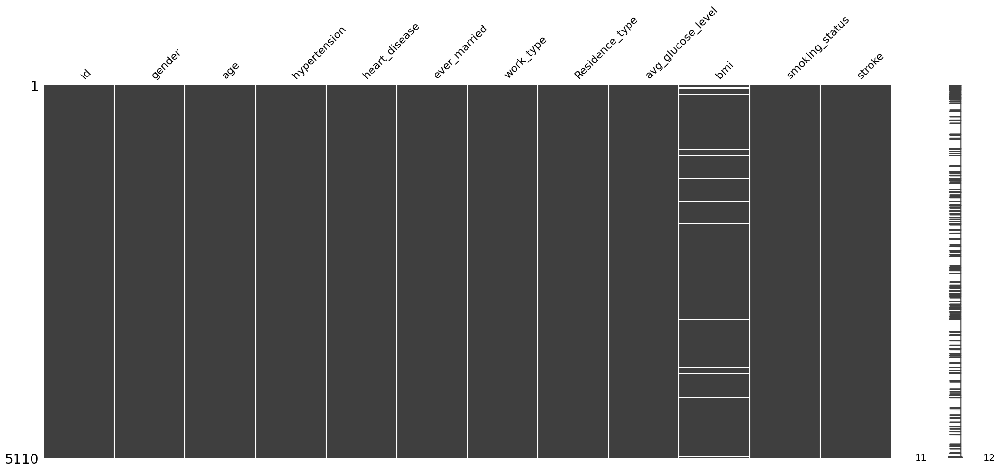

In [49]:
# matriz de N/As
msno.matrix(data)
plt.show()

# las lineas representan los N/As

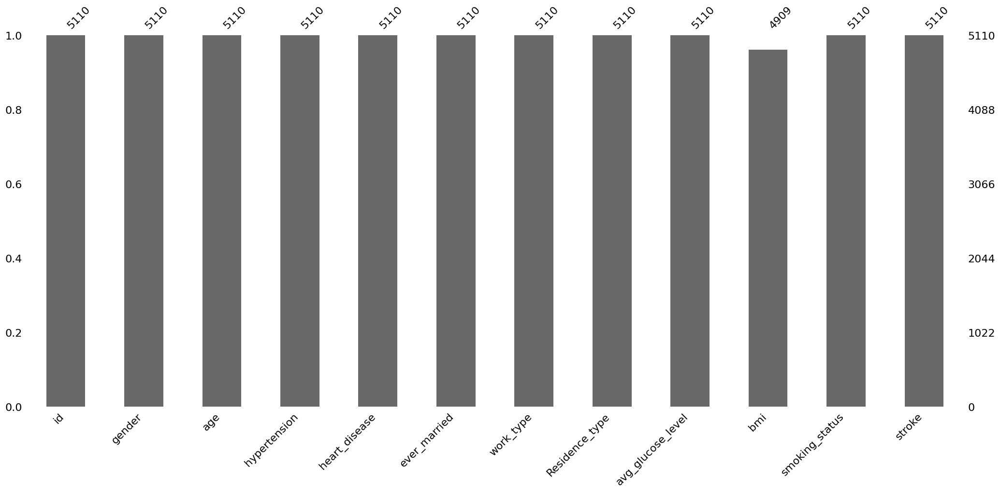

In [50]:
# barplot de los N/As
msno.bar(data)
plt.show()

In [51]:
# En el ejemplo la variable bmi tien N/As

Para este problema existen dos soluciones: eliminar los N/As ("dropna") o imputar los valores ("fillna").

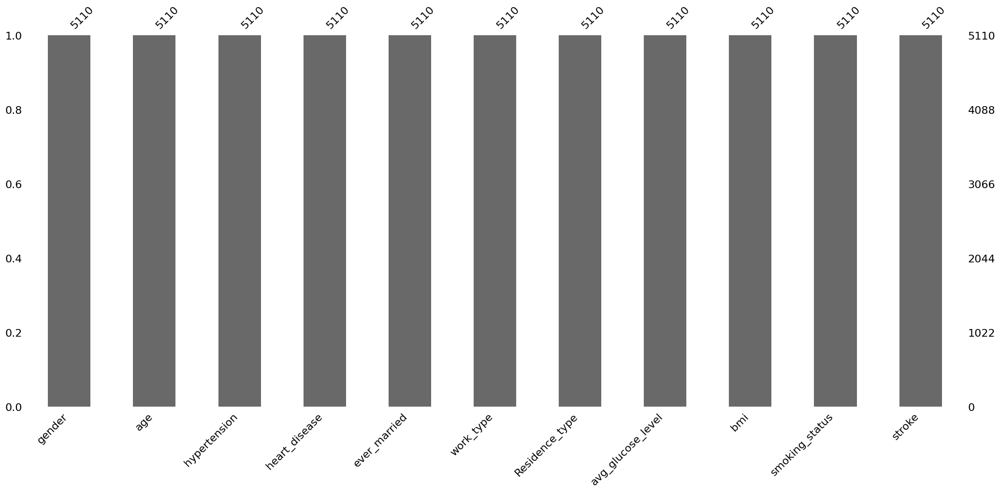

In [52]:
# ejemplo de imputación con la media:
data_ejemplo["bmi"] = data_ejemplo["bmi"].fillna((data_ejemplo["bmi"]).mean())
msno.bar(data_ejemplo)
plt.show()

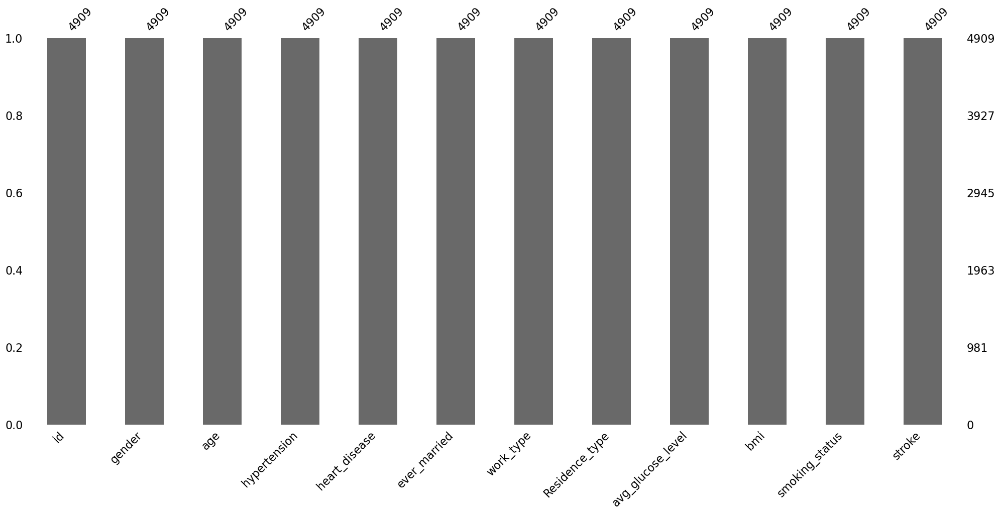

In [11]:
# Eliminar N/As
data = data.dropna()
data.shape
msno.bar(data)
plt.show()

### Borrar variables

Existen ciertos criterios para eliminar variables:

1.- Variables con un grupo muy mayoritario de más del 85%, es decir, casi todos los datos son del mismo grupo.

2.- Variable cuantitativa que es el mismo en casi todas las variables.

3.- Identificadores (id).

In [13]:
# se quitan variables id
columnas_borrar = ["id"]
data = data.drop(columnas_borrar,axis = 1)
data.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1


### Crear nuevas variables

In [55]:
# Ejemplo:crear el log de avg_glucose_level
data_ejemplo["avg_glucose_level"] = np.log(data["avg_glucose_level"])
data_ejemplo.head()

## revisar por que se producen NaN

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
id,,,,,,,,,,,
9046,Male,67,0,1,Yes,Private,Urban,NaN,36.600000,formerly smoked,1
51676,Female,61,0,0,Yes,Self-employed,Rural,NaN,28.893237,never smoked,1
31112,Male,80,0,1,Yes,Private,Rural,NaN,32.500000,never smoked,1
60182,Female,49,0,0,Yes,Private,Urban,NaN,34.400000,smokes,1
1665,Female,79,1,0,Yes,Self-employed,Rural,4.557659,24.000000,never smoked,1


In [56]:
# Crear variables por rangos:

#----- RANGOS
# 0 - 11 años -> kids
# 12 - 18 años -> teen
# 19 - 35 años -> young
# 36 - 65 años -> adult
# +65 -> mature

data["age_rangos"] = "kids"
data["age_rangos"].loc[(data["age"] >= 12) & (data["age"] <= 18)] = "teenagers"
data["age_rangos"].loc[(data["age"] >= 19) & (data["age"] <= 35)] = "young"
data["age_rangos"].loc[(data["age"] >= 36) & (data["age"] <= 65)] = "adult"
data["age_rangos"].loc[(data["age"] >= 65)] = "teenagers"
data.head()


C:\Users\valer\AppData\Local\Temp\ipykernel_9360\904272273.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\904272273.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\904272273.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\904272273.py:14: SettingWithCopyWarning:


A value is 

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,age_rangos
0,Male,67,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,teenagers
2,Male,80,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1,teenagers
3,Female,49,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,adult
4,Female,79,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,teenagers
5,Male,81,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,teenagers


# EDA: Análisis exploratorio de datos

## Univariado variables numéricas

En el análisis univariado se toman las variables y se van analizando por separado.

La exploración univariada consisten en dibujar las distribuciones y calcular los estadísticos de las variables una a una. De forma individual para:

- Identificar valores perdidos - que no existen
- Errores y outliers
- Visualizar la distribucion de cada variable
- Estadisticos descriptivos de centralidad, de dispersión y de forma
- En la descripcion de la variable respuesta - sales

### Estadisticos descriptivos

Cálculo de estadisticos descriptivos básicos.

In [57]:
data["avg_glucose_level"].describe()

count    4909.000000
mean      105.305150
std        44.424341
min        55.120000
25%        77.070000
50%        91.680000
75%       113.570000
max       271.740000
Name: avg_glucose_level, dtype: float64

In [58]:
# Ejemplo calculo de percentil 90
data["avg_glucose_level"].quantile(0.9)

## lista de calculos quese pueden hacer con pandas
## https://pandas.pydata.org/docs/reference/frame.html

187.00399999999993

### Identificar Outliers

Cálculo de outliers a través de la función outlier del inicio.

In [59]:
def find_outliers_IQR(df):
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    IQR = q3 - q1
    outliers = df[((df<(q1-1.5*IQR))) | (df>(q3+1.5*IQR))]
    return outliers

Función para ver todas las filas

In [60]:
pd.set_option("display.max_rows",None)

In [61]:
find_outliers_IQR(data["avg_glucose_level"])

0       228.69
3       171.23
4       174.12
5       186.21
14      214.09
16      191.61
17      221.29
20      193.94
21      233.29
22      228.70
23      208.30
28      195.23
30      212.08
32      196.92
33      252.72
36      219.72
44      213.03
45      243.58
55      196.71
58      194.99
59      180.93
60      185.17
66      221.58
71      179.12
73      228.56
76      240.09
90      226.98
95      235.63
97      240.59
101     190.32
102     231.61
107     191.82
113     224.10
115     216.94
122     259.63
123     249.31
128     200.59
130     190.14
132     182.99
134     206.09
135     263.32
137     207.28
138     194.37
139     199.20
144     221.79
149     239.07
151     223.83
155     231.56
157     221.89
158     195.71
163     203.87
175     185.49
179     213.22
187     215.94
190     205.77
193     271.74
195     200.62
196     242.52
201     175.29
212     208.65
215     205.33
217     210.40
219     219.73
220     250.89
222     205.35
225     216.58
226     18

In [62]:
##indices donde existen outliers.
find_outliers_IQR(data["avg_glucose_level"]).index

Index([   0,    3,    4,    5,   14,   16,   17,   20,   21,   22,
       ...
       5019, 5029, 5034, 5035, 5041, 5061, 5062, 5063, 5064, 5076],
      dtype='int64', length=567)

In [63]:
data.loc[find_outliers_IQR(data["avg_glucose_level"]).index,:]

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,age_rangos
0,Male,67,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,teenagers
3,Female,49,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,adult
4,Female,79,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,teenagers
5,Male,81,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,teenagers
14,Female,79,0,1,Yes,Private,Urban,214.09,28.2,never smoked,1,teenagers
16,Male,64,0,1,Yes,Private,Urban,191.61,37.5,smokes,1,adult
17,Male,75,1,0,Yes,Private,Urban,221.29,25.8,smokes,1,teenagers
20,Female,71,0,0,Yes,Govt_job,Rural,193.94,22.4,smokes,1,teenagers
21,Female,52,1,0,Yes,Self-employed,Urban,233.29,48.9,never smoked,1,adult
22,Female,79,0,0,Yes,Self-employed,Urban,228.70,26.6,never smoked,1,teenagers


In [64]:
data.loc[find_outliers_IQR(data["bmi"]).index,:]

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,age_rangos
21,Female,52,1,0,Yes,Self-employed,Urban,233.29,48.9,never smoked,1,adult
113,Female,45,0,0,Yes,Private,Rural,224.10,56.6,never smoked,1,adult
254,Female,47,0,0,Yes,Private,Urban,210.95,50.1,Unknown,0,adult
258,Female,74,1,0,Yes,Self-employed,Urban,205.84,54.6,never smoked,0,teenagers
270,Female,57,1,0,Yes,Private,Rural,129.54,60.9,smokes,0,adult
333,Female,52,0,0,Yes,Private,Urban,82.24,54.7,formerly smoked,0,adult
341,Female,37,0,0,Yes,Private,Rural,75.18,48.2,formerly smoked,0,adult
358,Male,52,0,0,Yes,Self-employed,Urban,78.40,64.8,never smoked,0,adult
430,Female,52,0,1,Yes,Private,Urban,72.79,54.7,never smoked,0,adult
462,Female,44,0,0,No,Private,Rural,103.78,49.8,formerly smoked,0,adult


### Ejemplo gráficos univariados

A continuación se se realizan graficos univariados para la variable avg_glucose_level utilizando libreria seaborn.

Entre ellos se encuentra: (1) Boxplot, (2) Density plot / histograma, (3) Mean plot / error plot, (4) Stripchart 

In [65]:
data.columns

Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke', 'age_rangos'],
      dtype='object')

Ejemplo de gráfico Boxplot utilizando libreria **seaborn**, el comando *sns.boxplot()*:

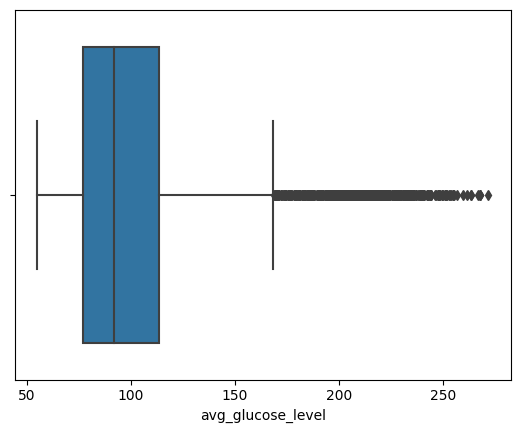

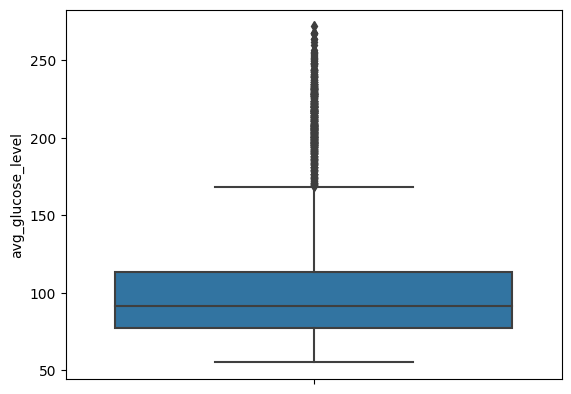

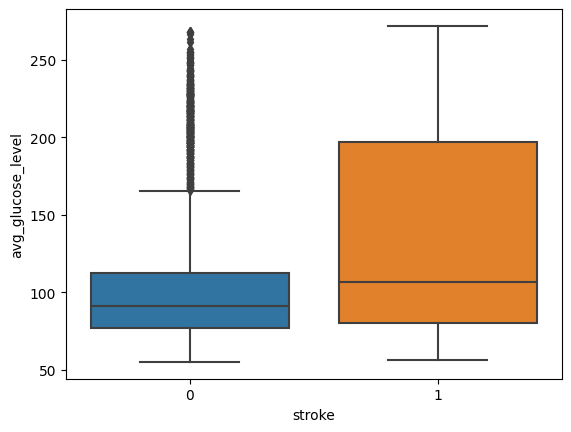

In [66]:
# Boxplot en el eje x
ax = sns.boxplot(data = data, x="avg_glucose_level")
plt.show()

# Boxplot en el eje y
ay = sns.boxplot(data = data, y="avg_glucose_level")
plt.show()

# Boxplot en el eje x e y por grupos
axy = sns.boxplot(data = data, y="avg_glucose_level", x="stroke")
plt.show()



Utilizando la libreria **matplot** se pueden *juntar dos o más gráficos*. Además, se utilizan los comandos *sns.stripplot*, *sns.violinplot* para crear otros tipos de gráficos.

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\1183180971.py:7: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



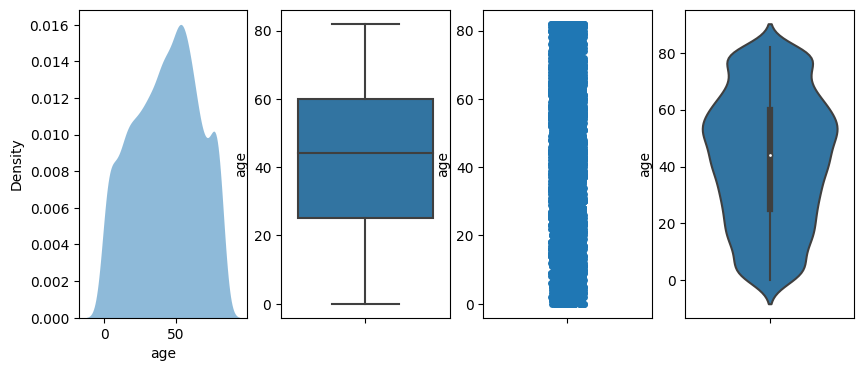

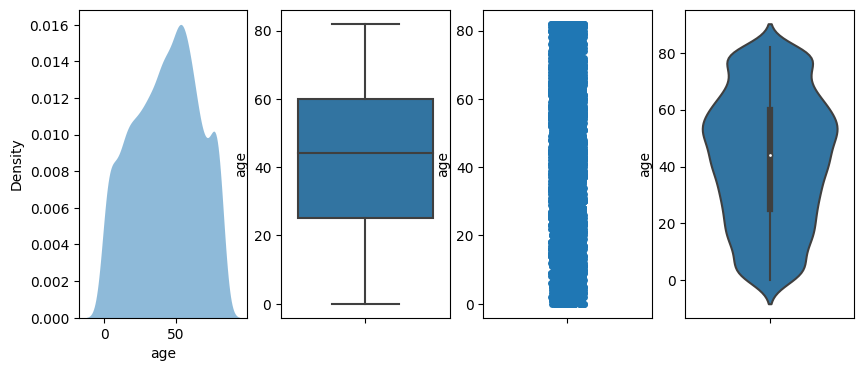

In [67]:
# Descripción de una variable cuantitativa: "age"
#para cambiar el nombre del eje
name_var = "age"

fig, axs = plt.subplots(ncols=4, figsize=(10,4))
# Histograma de densidad (eje 0)
sns.kdeplot(
    data=data, x="age",
    fill=True, common_norm=False, palette="crest",
    alpha=.5, linewidth=0, ax=axs[0])

#Boxplot (eje 1)
sns.boxplot(data=data, y="age", ax=axs[1])

#Stripchart (eje 2)
sns.stripplot(y="age", data=data, ax=axs[2])

#Violinplot (eje 3)
sns.violinplot(data=data, y="age", ax=axs[3])
fig


### Gráficos de variables cuantitativas continuas

Se utiliza *data.info()* para obtener cuales de las variables del dataframe son cuantitativas.

In [68]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4909 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             4909 non-null   object 
 1   age                4909 non-null   int64  
 2   hypertension       4909 non-null   object 
 3   heart_disease      4909 non-null   object 
 4   ever_married       4909 non-null   object 
 5   work_type          4909 non-null   object 
 6   Residence_type     4909 non-null   object 
 7   avg_glucose_level  4909 non-null   float64
 8   bmi                4909 non-null   float64
 9   smoking_status     4909 non-null   object 
 10  stroke             4909 non-null   object 
 11  age_rangos         4909 non-null   object 
dtypes: float64(2), int64(1), object(9)
memory usage: 627.6+ KB


A continuación, se seleccionan manualmente las variables cuantitativas y con ellas y se realizan los cuatro graficos anteriores.

In [15]:
var_num = ["age", "avg_glucose_level", "bmi"]

Luego, se realiza un **bucle for** para crear los gráficos anteriores para las variables cuantitativas seleccionadas manualmente.

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\156766266.py:7: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



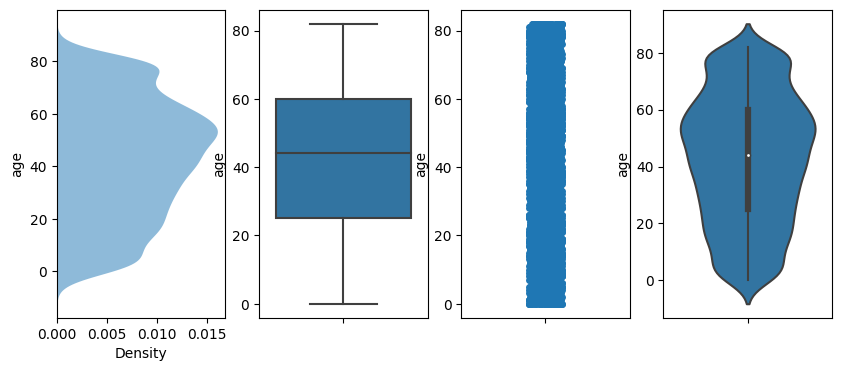

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\156766266.py:7: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



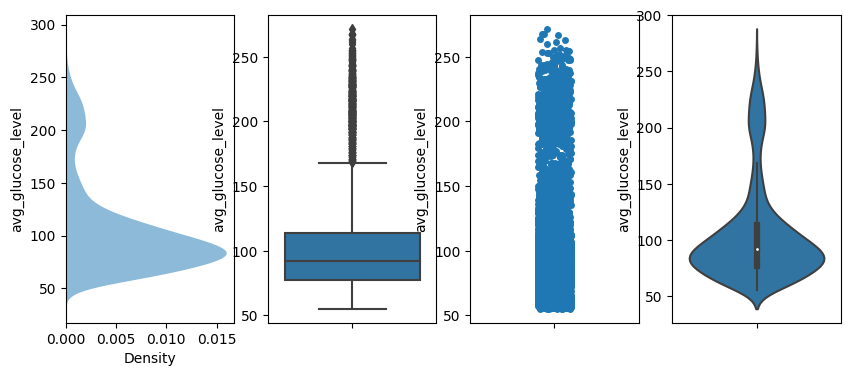

C:\Users\valer\AppData\Local\Temp\ipykernel_9360\156766266.py:7: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



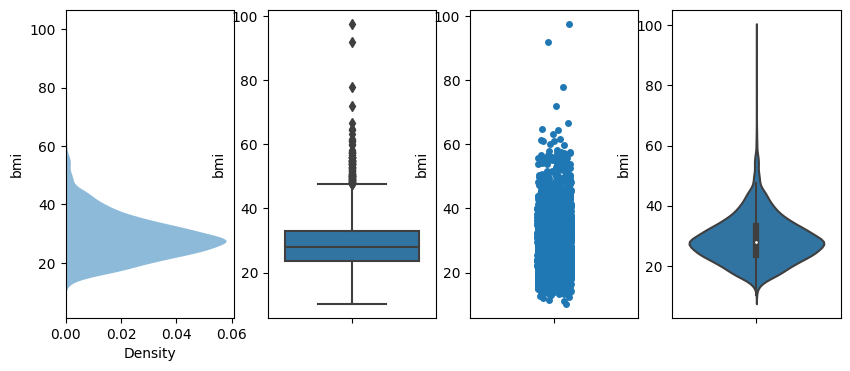

In [70]:
# Descripción de todas las variables cuantitativas continuas

for i in var_num:
    name_var = i  #i representa el indice de cada una de las variables que está dentro de var_num
    fig, axs = plt.subplots(ncols=4, figsize=(10,4))
    # Histograma de densidad (eje 0)
    sns.kdeplot(
        data=data, y=name_var,
        fill=True, common_norm=False, palette="crest",
        alpha=.5, linewidth=0, ax=axs[0])
    
    #Boxplot (eje 1)
    sns.boxplot(data=data, y=name_var, ax=axs[1])

    #Stripchart (eje 2)
    sns.stripplot(y=name_var, data=data, ax=axs[2])

    #Violinplot (eje 3)
    sns.violinplot(data=data, y=name_var, ax=axs[3])
    plt.show()

Ahora, también se obtiene la estadística descriptiva de las variables cuantitativas anteriores.

In [71]:
data[var_num].describe()

,age,avg_glucose_level,bmi
count,4909.000000,4909.000000,4909.000000
mean,42.854145,105.305150,28.893237
std,22.575986,44.424341,7.854067
min,0.000000,55.120000,10.300000
25%,25.000000,77.070000,23.500000
50%,44.000000,91.680000,28.100000
75%,60.000000,113.570000,33.100000
max,82.000000,271.740000,97.600000


## Univariado variables cualitativas

1. Se realiza una **tabla de frecuencias absolutas** para la variable stroke, esto a modo de ejemplo.

In [72]:
i = "stroke"
data[i].value_counts()

stroke
0    4700
1     209
Name: count, dtype: int64

2. Se **normalizan** las cifras, es decir, se pasan a porcentajes.

In [73]:
i = "stroke"
data[i].value_counts(normalize=True)

stroke
0    0.957425
1    0.042575
Name: proportion, dtype: float64

3. Se calcula tabla de frecuencia **relativa** y **absolutas** de la variable stroke.

In [74]:
i = "stroke"
pct = data[i].value_counts(normalize=True).reset_index().rename({"index":i}, axis=1)
pct["Frecuencias Absolutas"] = data[i].value_counts()
pct

#revisar por que no puedo cambiar el nombre de las columnas

,stroke,proportion,Frecuencias Absolutas
0,0,0.957425,4700
1,1,0.042575,209


4. Se realiza un **gráfico de barras** de la variable stroke.

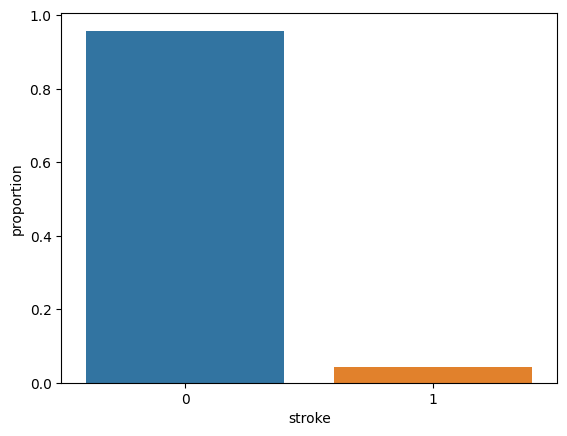

In [75]:
# x e y corresponden al nombre de las columnas de la tabla anteriorpct
sns.barplot(data=pct, x=i, y="proportion")
plt.show()

5. Se trealiza un **gráfico de torta** de las frecuencias absolutas.

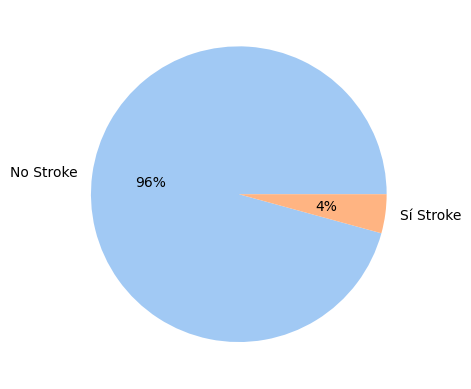

In [76]:
#define data
data = pct["Frecuencias Absolutas"]
labels = ["No Stroke", "Sí Stroke"]

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:2]

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

6. Se trealiza un **gráfico de torta** de la variable stroke.

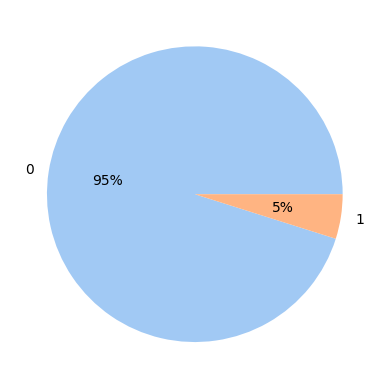

In [84]:
i = "stroke"
frec_abs = data[i].value_counts()
labels = data[i].value_counts().index

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:2]

#create pie chart
plt.pie(frec_abs, labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

Tabla de frecuencias absolutas
0    4700
1     209
Name: stroke, dtype: int64
Tabla de frecuencias de porcentajes
   stroke   percent
0       0  0.957425
1       1  0.042575


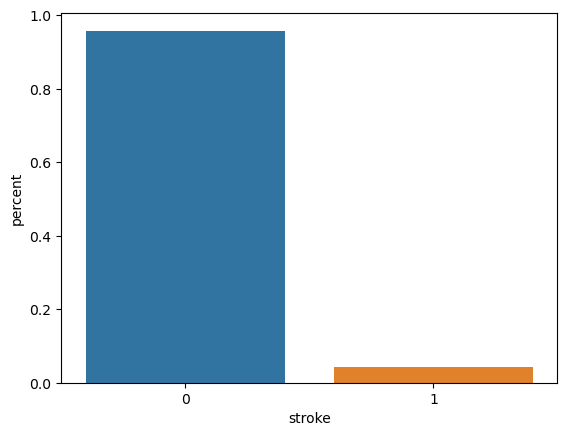

In [13]:
# Tablas de frecuencias y diagramas de barras de una variable
# respetar las minusculas

i="stroke"
# mostrar graficos y tablas de todas las variables cualitativas
print("Tabla de frecuencias absolutas")
print(data[i].value_counts())
print("Tabla de frecuencias de porcentajes")
pct = data[i].value_counts(normalize=True).reset_index().rename({"index":i, i:"percent"}, axis=1)
print(pct)
sns.barplot(x=i, y="percent", data=pct)
plt.show()

In [79]:
data.info()

<class 'pandas.core.series.Series'>
RangeIndex: 2 entries, 0 to 1
Series name: Frecuencias Absolutas
Non-Null Count  Dtype
--------------  -----
2 non-null      int64
dtypes: int64(1)
memory usage: 144.0 bytes


In [ ]:
data.columns

7. Se realiza un **bucle for** para generar gráficos y tablas de frecuencias para todas las variables cualtativas.

Variable = gender
        Frecuencias Relativas  Frecuencias Absolutas
gender                                              
Female               0.590141                   2897
Male                 0.409656                   2011
Other                0.000204                      1


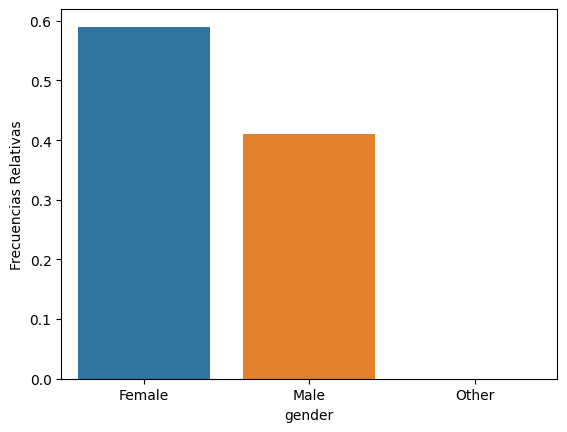

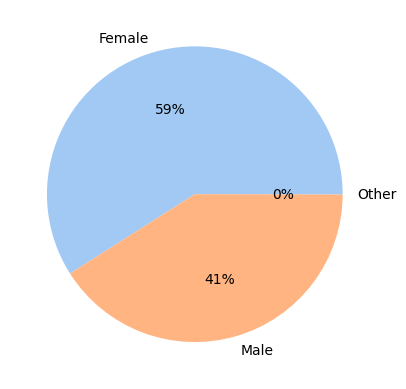


Variable = hypertension
              Frecuencias Relativas  Frecuencias Absolutas
hypertension                                              
0                          0.908128                   4458
1                          0.091872                    451


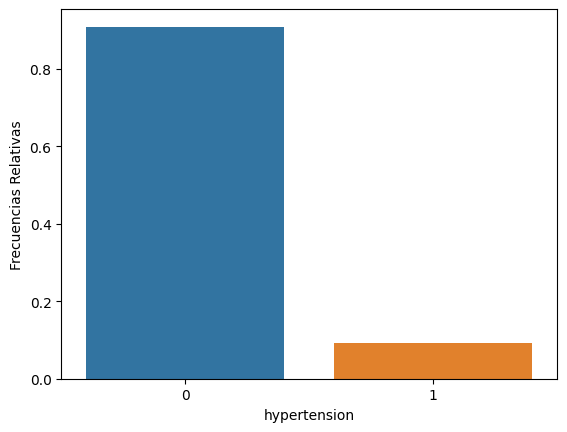

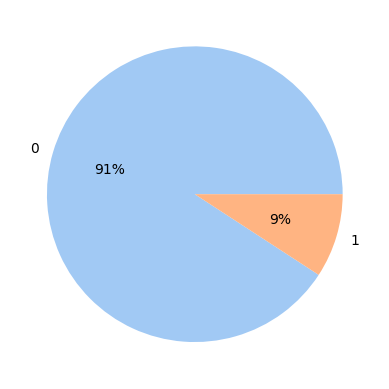


Variable = heart_disease
               Frecuencias Relativas  Frecuencias Absolutas
heart_disease                                              
0                           0.950499                   4666
1                           0.049501                    243


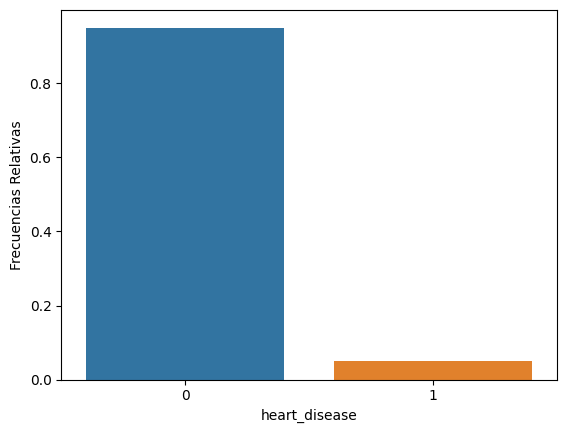

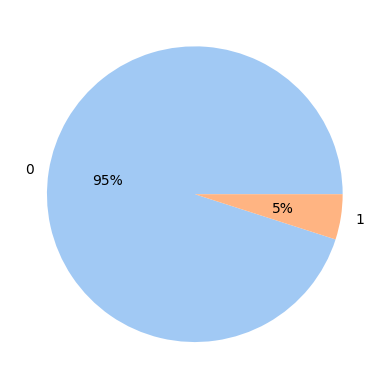


Variable = ever_married
              Frecuencias Relativas  Frecuencias Absolutas
ever_married                                              
Yes                        0.652679                   3204
No                         0.347321                   1705


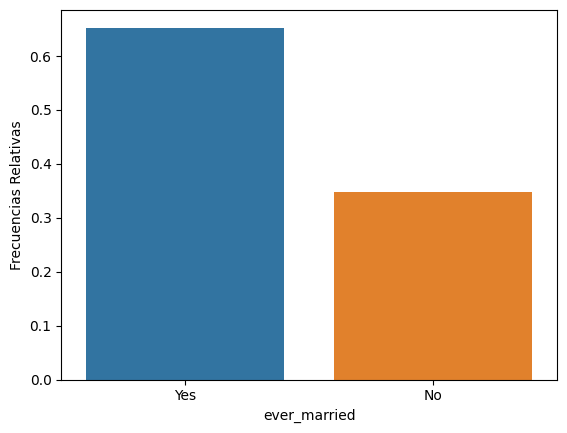

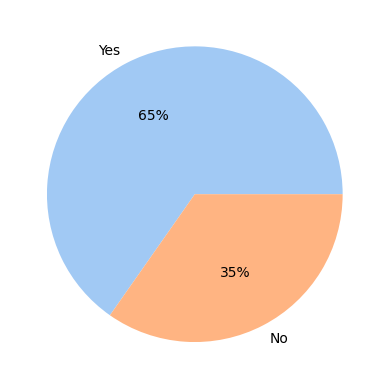


Variable = work_type
               Frecuencias Relativas  Frecuencias Absolutas
work_type                                                  
Private                     0.572622                   2811
Self-employed               0.157873                    775
children                    0.136688                    671
Govt_job                    0.128336                    630
Never_worked                0.004482                     22


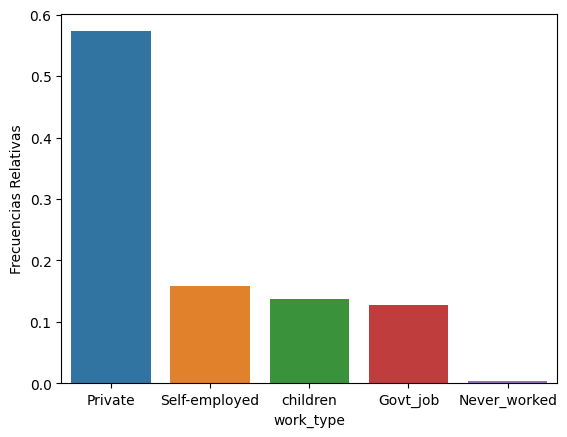

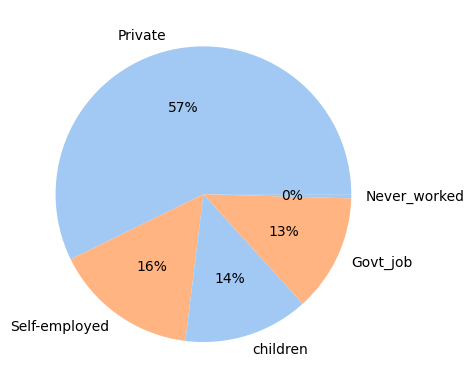


Variable = Residence_type
                Frecuencias Relativas  Frecuencias Absolutas
Residence_type                                              
Urban                        0.507232                   2490
Rural                        0.492768                   2419


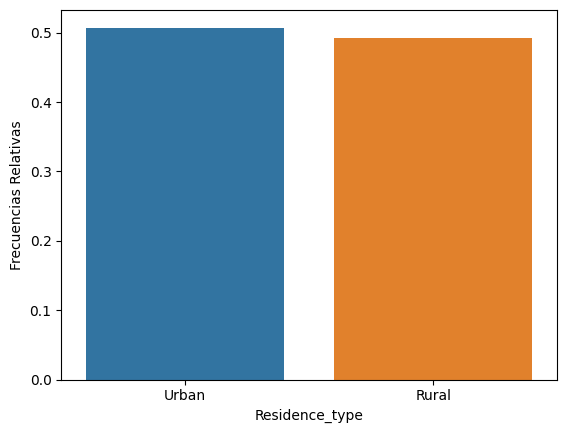

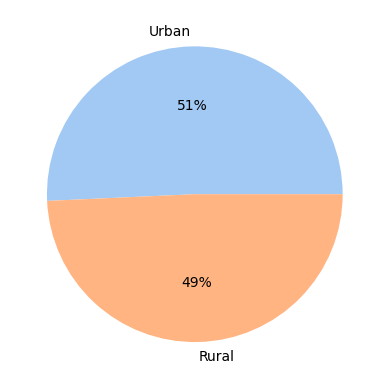


Variable = smoking_status
                 Frecuencias Relativas  Frecuencias Absolutas
smoking_status                                               
never smoked                  0.377266                   1852
Unknown                       0.302098                   1483
formerly smoked               0.170503                    837
smokes                        0.150132                    737


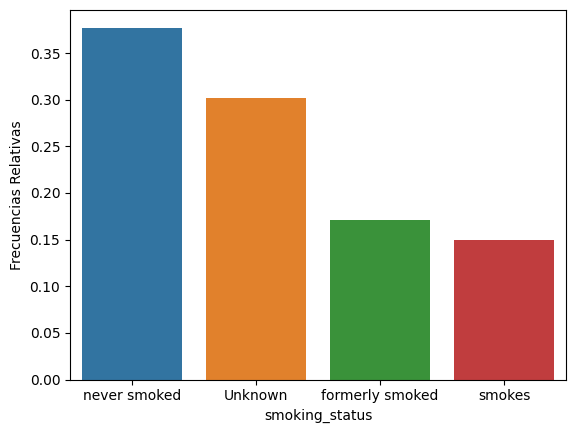

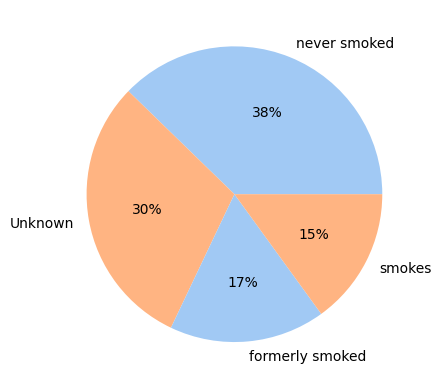


Variable = stroke
        Frecuencias Relativas  Frecuencias Absolutas
stroke                                              
0                    0.957425                   4700
1                    0.042575                    209


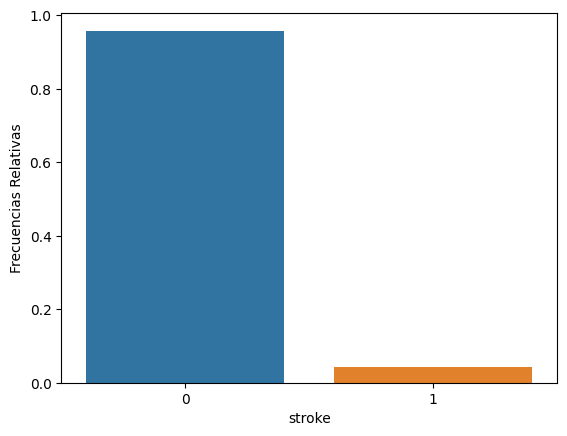

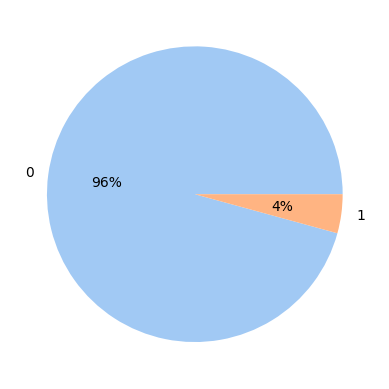

In [101]:
# Se crea variable que contiene todas las variables cualitativas.
var_cual = ['gender','hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type','smoking_status', 'stroke']

for i in var_cual:
    
    print("====================================================")
    print("Variable = " +i)
    print("====================================================")
    
    #Tabla de frecuencia relativa y absolutas
    pct = pd.DataFrame(data[i].value_counts(normalize=True))
    pct.columns = ["Frecuencias Relativas"]
    pct["Frecuencias Absolutas"] = data[i].value_counts()
    print(pct)
    
    #Grafico de barras
    sns.barplot(data=pct, x=pct.index, y="Frecuencias Relativas")
    plt.show()
    
    #Grafico de tortas
    frec_abs = data[i].value_counts() #grabo las frecuencias absolutas
    labels = data[i].value_counts().index # tomo los nombres de los grupos de la variable cualitativa i
    colors = sns.color_palette('pastel')[0:2] #defino los colores segun paleta pastel seaborn
    plt.pie(frec_abs, labels = labels, colors = colors, autopct='%.0f%%')#piechart donde muestro los porcentajes
    plt.show()
    
    print("====================================================")
    print("====================================================")
    print("")


## Multivariado

Relacionar, aplicar correlación, 
- Coeficientes de correlación
- Diagramas de dispersión
- Matrixplot
- Correlograma
    
Comparar medias
- Stripchart
- Boxplot 1 o 2 factores
- Density plot 1 factor
- Violin plot 1 o 2 factores

Comparar proporciones
- tablas de contingencia (frecuencias condicionadas)
- diagramas de barras de las tablas de contingencia

Otras herramientas:
- bubbleplot
- radarplot

### Correlaciones 1: cruzar variables numéricas

#### Diagrama de Dispersión

In [ ]:
data.columns

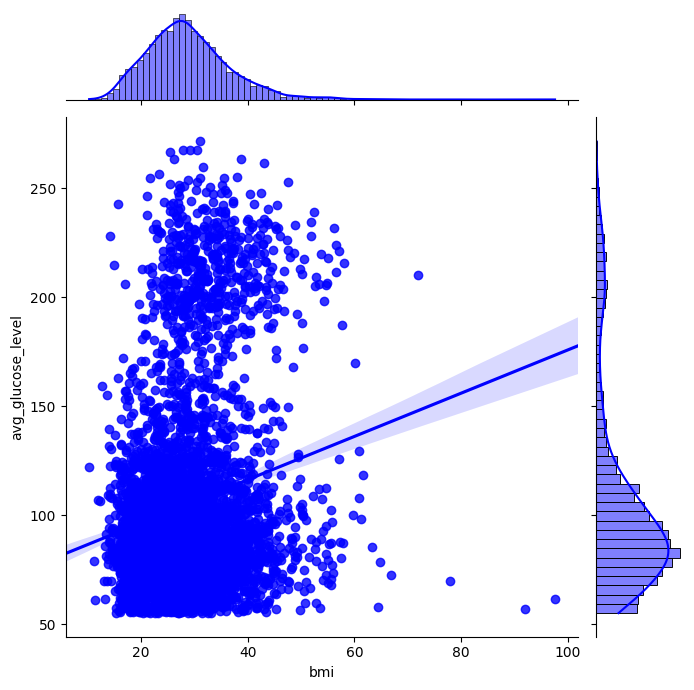

In [102]:
# Diagrama de dispersión 2D con la linea de tendencia

var_y = "avg_glucose_level" 
var_x = "bmi"

grafico_1 = sns.jointplot(x=var_x, y=var_y, data=data,
                         kind="reg", truncate=False, # reg es la linea de regresión
                         color="b", height=7)
plt.show()

c:\users\valer\appdata\local\programs\python\python39\lib\site-packages\seaborn\distributions.py:1185: UserWarning:

The following kwargs were not used by contour: 'truncate'



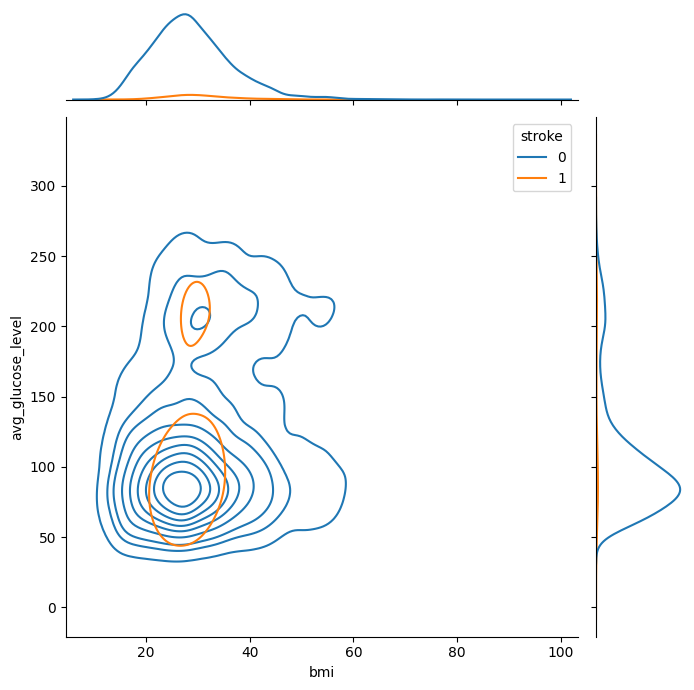

In [103]:
# Diagrama de dispersión 2D por grupos con la linea de tendencia

var_y = "avg_glucose_level" 
var_x = "bmi"
var_grupos = "stroke"

grafico_1 = sns.jointplot(x=var_x, y=var_y, data=data, hue=var_grupos,
                         kind="kde", truncate=False,
                         color="b", height=7)
plt.show()

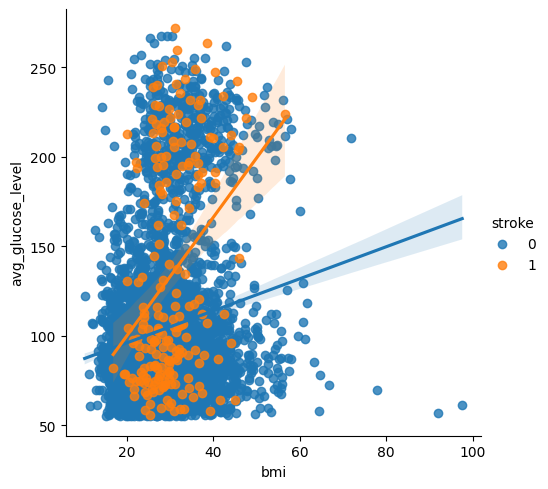

In [104]:
# Diagrama de dispersion con linea de tendencia por grupos

var2_y = "avg_glucose_level" 
var2_x = "bmi"
var2_grupos = "stroke"

grafico_2 = sns.lmplot(data=data, x=var2_x, y=var2_y, 
                       hue=var2_grupos, height=5)
plt.show()

#### Diagrama 3D

In [14]:
# Diagramas de dispersión 3D

z="avg_glucose_level"
x="bmi"
y="age"
var_color = "stroke"

#plotly
fig = px.scatter_3d(data, x=x, y=y, z=z, size_max=3, color=var_color)
fig.update_traces(marker_size = 2)
fig.show()

#### Coeficientes de Correlación

In [106]:
var_num

['age', 'avg_glucose_level', 'bmi']

In [16]:
# Seleccionando las variables numericas
x = data[var_num].copy()
x.head()

,age,avg_glucose_level,bmi
0,67.0,228.69,36.6
2,80.0,105.92,32.5
3,49.0,171.23,34.4
4,79.0,174.12,24.0
5,81.0,186.21,29.0


In [17]:
# Coeficientes de correlación:

#Pearson
print("*****************************************")
print("Coeficiente de Pearson")
print("*****************************************")
print("")
print(x.corr(method="pearson"))

#Spearman
print("*****************************************")
print("Coeficiente de Spearman")
print("*****************************************")
print("")
print(x.corr(method="spearman"))

#Kendall
print("*****************************************")
print("Coeficiente de Kendall")
print("*****************************************")
print("")
print(x.corr(method="kendall"))



*****************************************
Coeficiente de Pearson
*****************************************

                        age  avg_glucose_level       bmi
age                1.000000           0.235838  0.333398
avg_glucose_level  0.235838           1.000000  0.175502
bmi                0.333398           0.175502  1.000000
*****************************************
Coeficiente de Spearman
*****************************************

                        age  avg_glucose_level      bmi
age                1.000000           0.140809  0.37565
avg_glucose_level  0.140809           1.000000  0.11437
bmi                0.375650           0.114370  1.00000
*****************************************
Coeficiente de Kendall
*****************************************

                        age  avg_glucose_level       bmi
age                1.000000           0.094818  0.255237
avg_glucose_level  0.094818           1.000000  0.076474
bmi                0.255237           0.076474  1.00

#### Correlograma

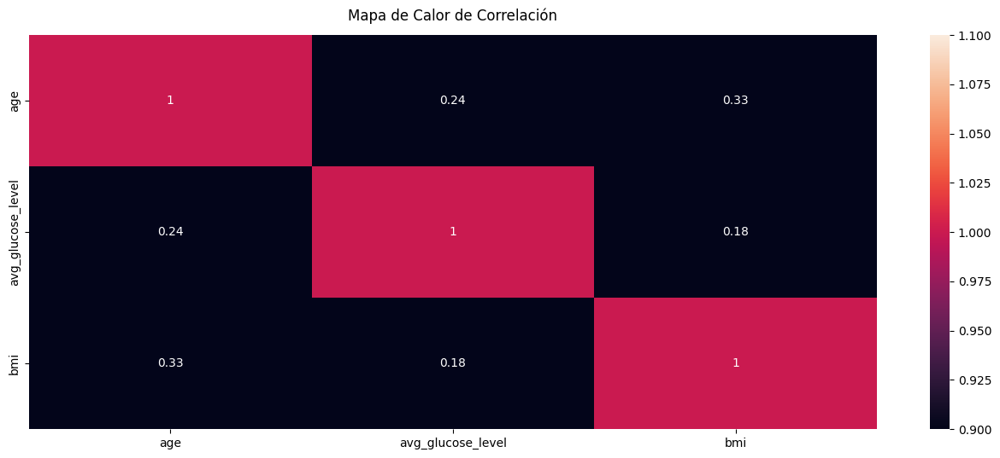

In [109]:
# https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

x_1 = data[var_num]

# Aumenta el tamaño del mapa
plt.figure(figsize=(16, 6))

#Se guarda el mapa de calor dentro de una variable para poder acceder a él facilmente cuando se requiera.
#Se fija el rango de los valores a colocar dentro del mapa de calor desde el -1 a 1, y fijar annot como True
#para que calcule la correlación.
heatmap = sns.heatmap(x_1.corr(), vmin=1, vmax=1, annot=True)

#Se da un titulo al mapa de calor y se define la distancia del titulo desde el comienzo del mapa de calor.
heatmap.set_title("Mapa de Calor de Correlación", fontdict={"fontsize":12}, pad=12)
plt.show()

#### Matrixplot

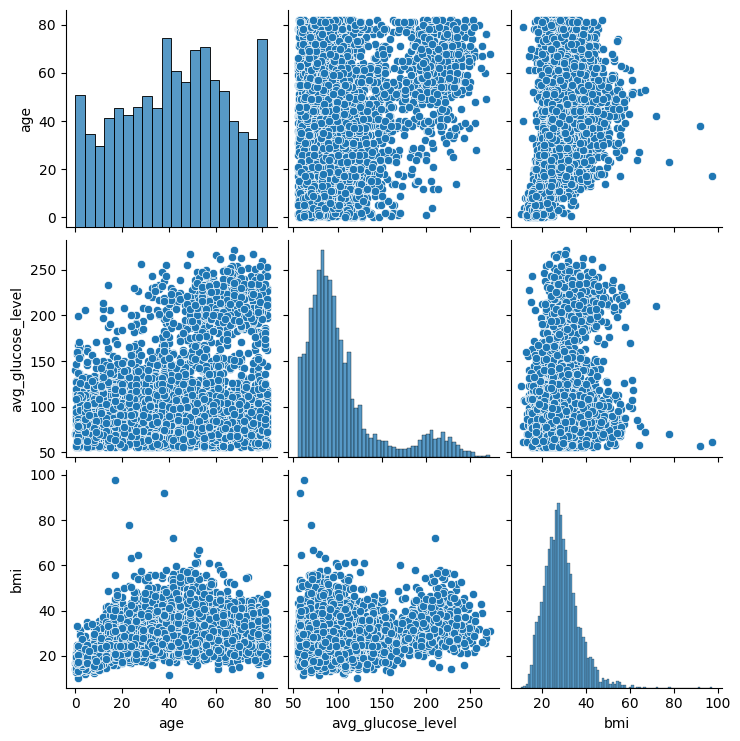

In [110]:
columnas_plot = ["age", "avg_glucose_level", "bmi"]

#libreria seaborn
sns.pairplot(data[columnas_plot])
plt.show()

#Matrixplot interactivo
#libreria plotly
fig_3 = px.scatter_matrix(data[columnas_plot])
fig_3.show()

In [18]:
# Matrixplot interactivo por grupos stroke
columnas_plot = ["age", "avg_glucose_level", "bmi"]
fig_4 = px.scatter_matrix(data, dimensions=columnas_plot,
                         color="stroke")
fig_4.show()


C:\Users\valer\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



### Correlaciones 2: Cruzar variables cualitativas

#### Tablas de contingencia (condicionadas) y el gráfico de barras

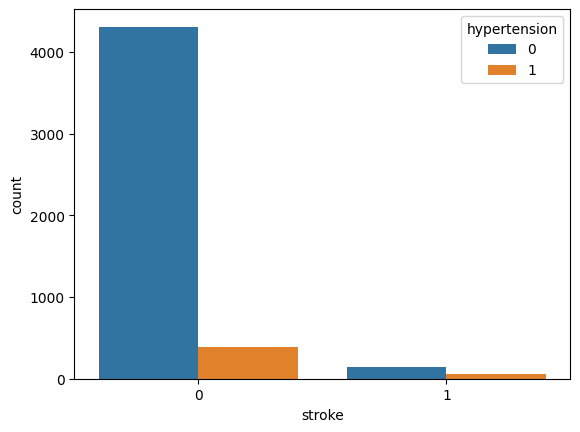

Frecuencia Absoluta
stroke hypertension                     
0      0                            4309
       1                             391
1      0                             149
       1                              60

In [112]:
# Diagramas de barras de dos factores de frecuencias absolutas

x = "stroke"
y = "hypertension"

# Libreria seaborn
sns.countplot(x=x, hue=y, data=data) # hue es estar agrupado segun tal variable
plt.show()

#Tablas de frecuencias de dos factores (libreria pandas):
df = pd.DataFrame(data[[x,y]].value_counts())
df.columns=["Frecuencia Absoluta"]
df 

In [ ]:
# Tabla de contingencia de dos variables
data[[x,y]].value_counts()

In [ ]:
data.groupby([x,y]).size()

In [ ]:
data.groupby([x]).size()

In [ ]:
(data.groupby([x,y]).size() / data.groupby([x]).size())

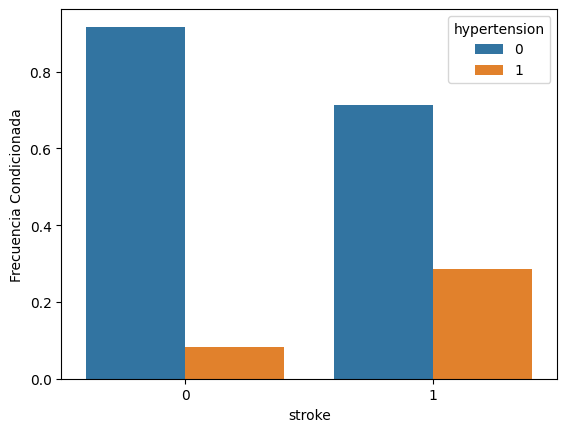

,stroke,hypertension,Frecuencia Condicionada
0,0,0,0.916809
1,0,1,0.083191
2,1,0,0.712919
3,1,1,0.287081


In [113]:
# Diagrama de barras de dos factores de frecuencias condicionadas a los grupos de la vaiable x.

x="stroke"
y="hypertension"

# Primero se agrupas los datos por x e y y se calcula el size (tabla de frecuencia absoluta)
# Luego se agrupa por la variable x y se dividela tabla1 por los valores de la tabla 2 (stroke)
pct2 = (data.groupby([x,y]).size() / data.groupby([x]).size()).reset_index().rename({0:"Frecuencia Condicionada"}, axis=1)

# Libreria seaborn
sns.barplot(x=x, hue=y, y="Frecuencia Condicionada", data=pct2)
plt.show()
pct2

# la suma de las dos barras es igual a 1, se ha normalizado (porcentajes). 
# Los grupos están balanceados

#### Iteración de las variables cualitativas v/s stroke

In [ ]:
var_cual

*******************************************
gender vs stroke
*******************************************


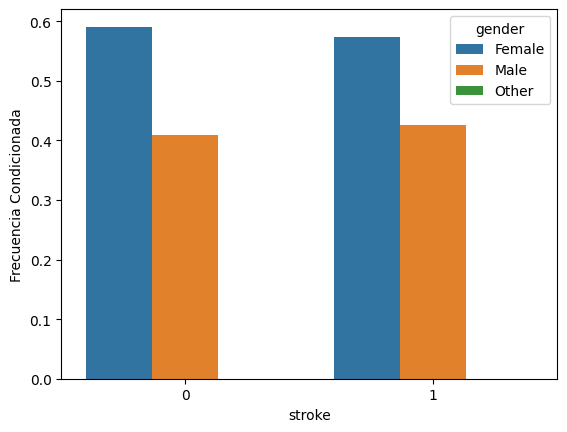

   stroke  gender  Frecuencia Condicionada
0       0  Female                 0.590851
1       0    Male                 0.408936
2       0   Other                 0.000213
3       1  Female                 0.574163
4       1    Male                 0.425837
*******************************************
hypertension vs stroke
*******************************************


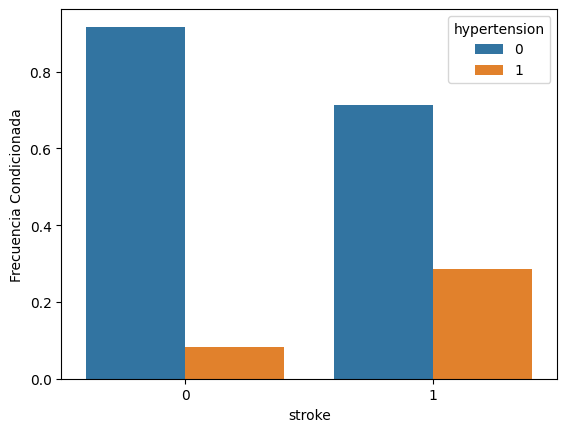

   stroke  hypertension  Frecuencia Condicionada
0       0             0                 0.916809
1       0             1                 0.083191
2       1             0                 0.712919
3       1             1                 0.287081
*******************************************
heart_disease vs stroke
*******************************************


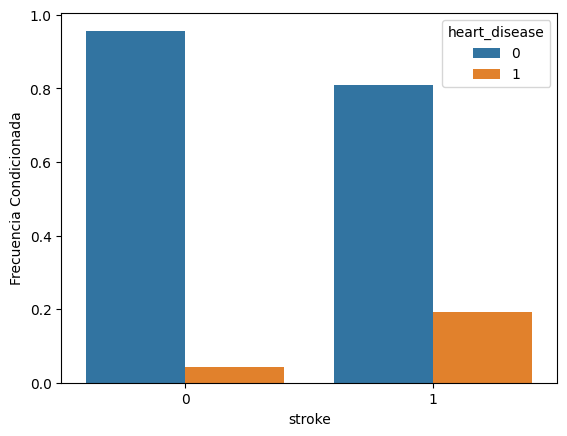

   stroke  heart_disease  Frecuencia Condicionada
0       0              0                 0.956809
1       0              1                 0.043191
2       1              0                 0.808612
3       1              1                 0.191388
*******************************************
ever_married vs stroke
*******************************************


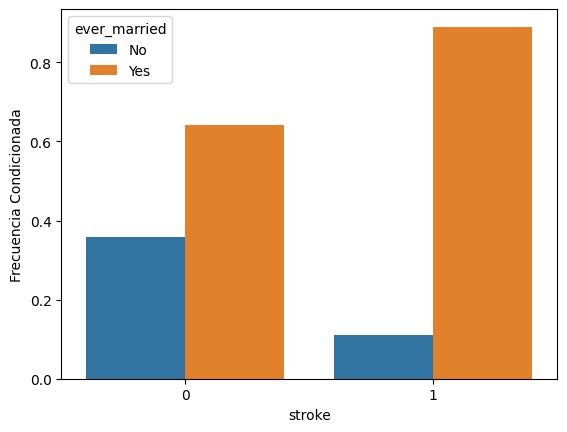

   stroke ever_married  Frecuencia Condicionada
0       0           No                 0.357872
1       0          Yes                 0.642128
2       1           No                 0.110048
3       1          Yes                 0.889952
*******************************************
work_type vs stroke
*******************************************


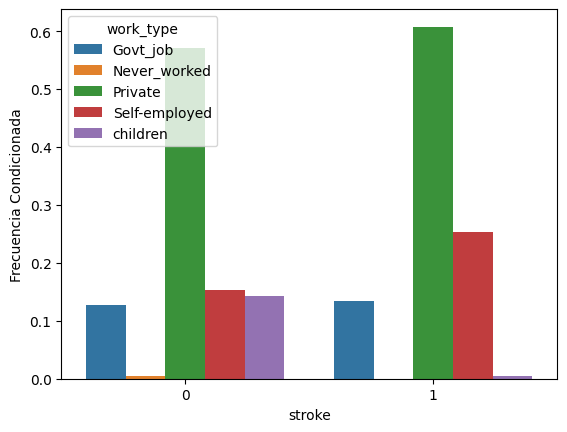

   stroke      work_type  Frecuencia Condicionada
0       0       Govt_job                 0.128085
1       0   Never_worked                 0.004681
2       0        Private                 0.571064
3       0  Self-employed                 0.153617
4       0       children                 0.142553
5       1       Govt_job                 0.133971
6       1        Private                 0.607656
7       1  Self-employed                 0.253589
8       1       children                 0.004785
*******************************************
Residence_type vs stroke
*******************************************


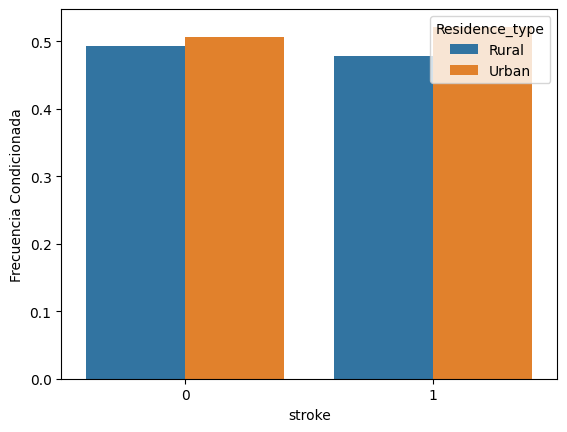

   stroke Residence_type  Frecuencia Condicionada
0       0          Rural                 0.493404
1       0          Urban                 0.506596
2       1          Rural                 0.478469
3       1          Urban                 0.521531
*******************************************
smoking_status vs stroke
*******************************************


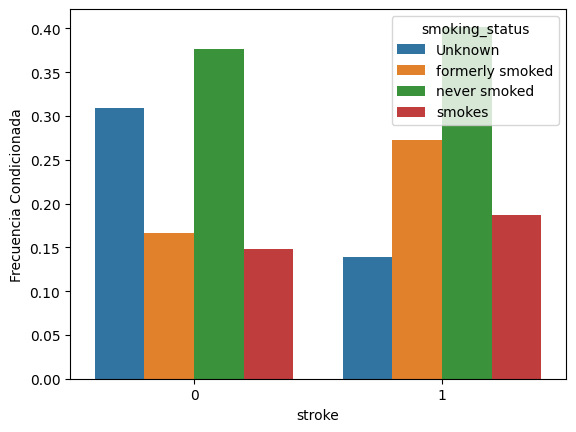

   stroke   smoking_status  Frecuencia Condicionada
0       0          Unknown                 0.309362
1       0  formerly smoked                 0.165957
2       0     never smoked                 0.376170
3       0           smokes                 0.148511
4       1          Unknown                 0.138756
5       1  formerly smoked                 0.272727
6       1     never smoked                 0.401914
7       1           smokes                 0.186603


In [114]:
# Diagrama de barras de dos factores de frecuencias condicionales de TODAS
# las variables cualitativas v/s stroke.

x="stroke"
vec_y=['gender',
 'hypertension',
 'heart_disease',
 'ever_married',
 'work_type',
 'Residence_type',
 'smoking_status']

for i in vec_y:
    
    print("*******************************************")
    print(i + " vs " + x)
    print("*******************************************")
    
    # Se selecciona variable y segun el contador
    y = i

    # Cálculo de tabla de contingencia condicionada a x (stroke)
    pct3 = (data.groupby([x,y]).size() / data.groupby([x]).size()).reset_index().rename({0:"Frecuencia Condicionada"}, axis=1)

    # Libreria seaborn
    sns.barplot(x=x, hue=y, y="Frecuencia Condicionada", data=pct3)
    plt.show()
    print(pct3)

# la suma de las dos barras es igual a 1, se ha normalizado (porcentajes). 
# Los grupos están balanceados

#### Comparar medias - variable cuantitativa v/s cualitativa

##### Descriptivos por grupos

In [19]:
#para ver todas las columnas
pd.set_option("display.max_columns", None)

data.groupby(by="stroke").describe()

age                                                       \
         count       mean        std    min   25%   50%   75%   max   
stroke                                                                
0       4700.0  41.760451  22.268129   0.08  24.0  43.0  59.0  82.0   
1        209.0  67.712919  12.402848  14.00  58.0  70.0  78.0  82.0   

       hypertension                                               \
              count      mean       std  min  25%  50%  75%  max   
stroke                                                             
0            4700.0  0.083191  0.276201  0.0  0.0  0.0  0.0  1.0   
1             209.0  0.287081  0.453486  0.0  0.0  0.0  1.0  1.0   

       heart_disease                                               \
               count      mean       std  min  25%  50%  75%  max   
stroke                                                              
0             4700.0  0.043191  0.203310  0.0  0.0  0.0  0.0  1.0   
1              209.0  0.191388  0.394338  0.0  0.0  0.0  0.0  1.0   

       avg_glucose_level                                                 \
                   count        mean        std    min      25%     50%   
stroke                                                                    
0                 4700.0  104.003736  42.997798  55.12  76.8875   91.21   
1                  209.0  134.571388  62.462047  56.11  80.4300  106.58   

                             bmi                                               \
             75%     max   count       mean       std   min   25%   50%   75%   
stroke                                                                          
0       112.4325  267.76  4700.0  28.823064  7.908287  10.3  23.4  28.0  33.1   
1       196.9200  271.74   209.0  30.471292  6.329452  16.9  26.4  29.7  33.7   

              
         max  
stroke        
0       97.6  
1       56.6

In [20]:
x = "stroke"
y = ["age", "avg_glucose_level", "bmi"]

vec_var = np.append(x,y)

df1=(data[vec_var].groupby(x)
    .describe()
    .unstack() # con este comando se puede compactar la tabla anterior
    .unstack(1))

df1

count        mean        std    min      25%  \
                  stroke                                                  
age               0       4700.0   41.760451  22.268129   0.08  24.0000   
                  1        209.0   67.712919  12.402848  14.00  58.0000   
avg_glucose_level 0       4700.0  104.003736  42.997798  55.12  76.8875   
                  1        209.0  134.571388  62.462047  56.11  80.4300   
bmi               0       4700.0   28.823064   7.908287  10.30  23.4000   
                  1        209.0   30.471292   6.329452  16.90  26.4000   

                             50%       75%     max  
                  stroke                            
age               0        43.00   59.0000   82.00  
                  1        70.00   78.0000   82.00  
avg_glucose_level 0        91.21  112.4325  267.76  
                  1       106.58  196.9200  271.74  
bmi               0        28.00   33.1000   97.60  
                  1        29.70   33.7000   56.60

##### Distribuciones por grupos

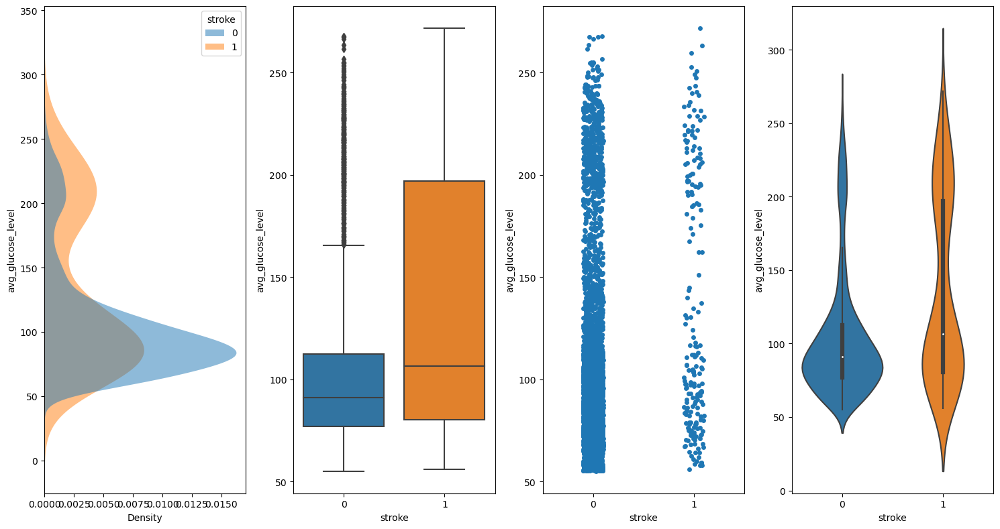

In [21]:
# Varios plots a la vez de un factor:

y = "stroke" #selecciona la variable numerica
x = "avg_glucose_level" #selecciona la variable cualitativa o factor

fig, axs = plt.subplots(ncols=4, figsize=(15,8))
sns.kdeplot(
    data=data, y=x, hue=y,
    fill=True, common_norm=False,
    alpha=.5, linewidth=0, ax=axs[0])
sns.boxplot(data=data, y=x, x=y, ax=axs[1])
sns.stripplot(y=x, data=data, x=y, ax=axs[2])
sns.violinplot(data=data, y=x, x=y, ax=axs[3])
fig.tight_layout()
plt.show()

***************************************
Variable age vs stroke
***************************************


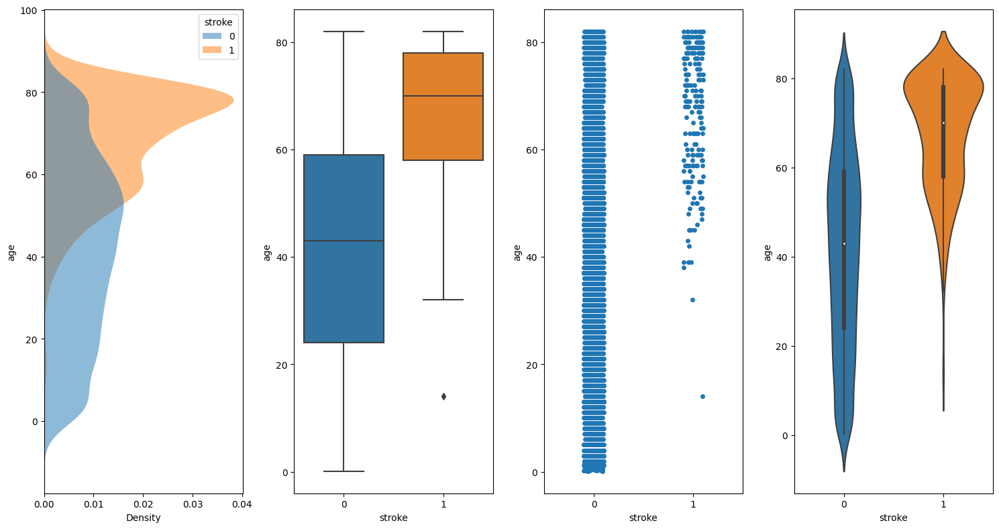

***************************************
Variable avg_glucose_level vs stroke
***************************************


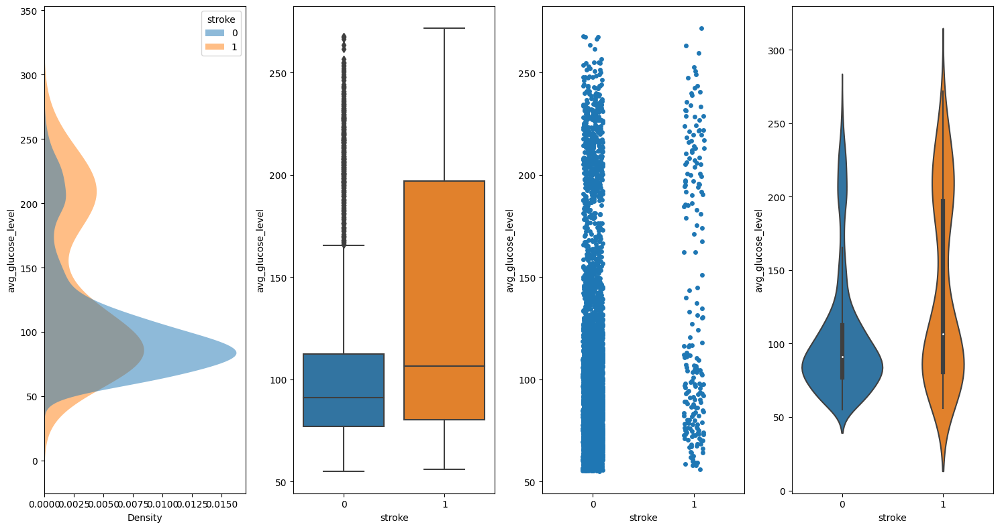

***************************************
Variable bmi vs stroke
***************************************


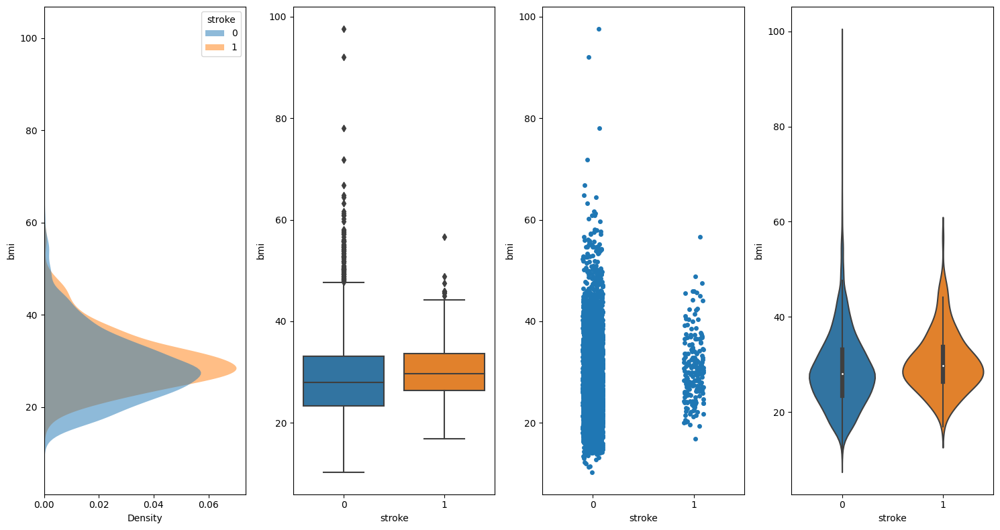

In [115]:
# Bucle for de varios plots a la vez de un factor (variable stroke):

y = "stroke" #selecciona la variable numerica
vec_x = ["age", "avg_glucose_level", "bmi"] #selecciona la variable cualitativa o factor

for i in vec_x:
    
    print("***************************************")
    print("Variable " + i + " vs " + y)
    print("***************************************")
    x=i
    fig, axs = plt.subplots(ncols=4, figsize=(15,8))
    sns.kdeplot(
        data=data, y=x, hue=y,
        fill=True, common_norm=False,
        alpha=.5, linewidth=0, ax=axs[0])
    sns.boxplot(data=data, y=x, x=y, ax=axs[1])
    sns.stripplot(y=x, data=data, x=y, ax=axs[2])
    sns.violinplot(data=data, y=x, x=y, ax=axs[3])
    fig.tight_layout()
    plt.show()

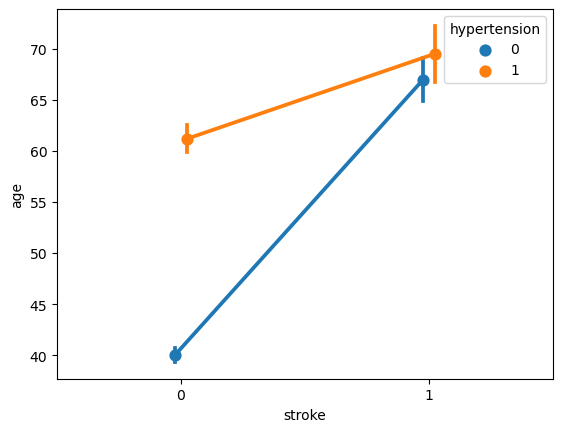

In [22]:
# Diagrama de error o de medias de dos factores

x = "age" # seleccion de variable numerica
y = "stroke" # seleccion de variable cualitativa o factor
z = "hypertension" #seleccion de la segunda variable cualitativa o factor

sns.pointplot(x=y, y=x, data=data, hue=z, dodge=True)
plt.show()

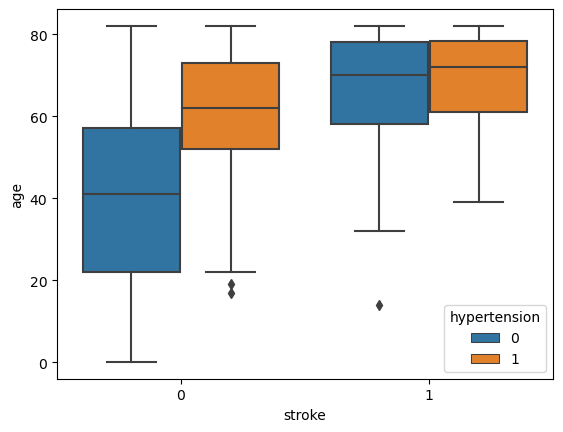

In [23]:
# Diagrama de error o de medias de dos factores

x = "age" # seleccion de variable numerica
y = "stroke" # seleccion de variable cualitativa o factor
z = "hypertension" #seleccion de la segunda variable cualitativa o factor

sns.boxplot(x=y, y=x, data=data, hue=z, dodge=True)
plt.show()

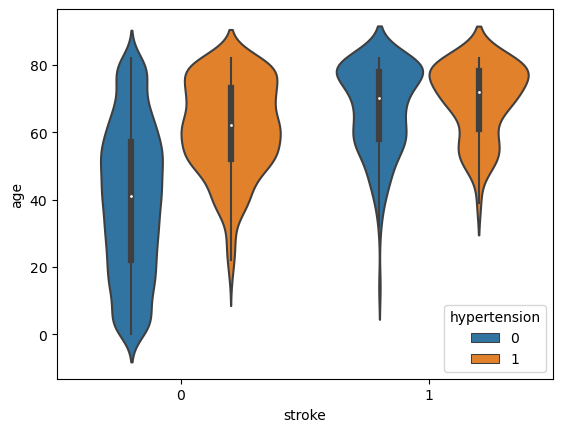

In [24]:
# Diagrama de error o de medias de dos factores

x = "age" # seleccion de variable numerica
y = "stroke" # seleccion de variable cualitativa o factor
z = "hypertension" #seleccion de la segunda variable cualitativa o factor

sns.violinplot(x=y, y=x, data=data, hue=z, dodge=True)
plt.show()

#### Multiples variables

In [25]:
# Diagrama de burbujaabs

x = "bmi"
y = "age"
z_size = "avg_glucose_level"
var_grupos = "stroke"

fig_5 = px.scatter(data, x=x, y=y,
                  size=z_size, color=var_grupos,
                  hover_name="hypertension", size_max=10)

fig_5.show()

In [ ]:
## bubble plot https://plotly.com/python/bubble-charts/
## radar chart https://plotly.com/python/radar-chart/

# Inferencia: Comparaciones, relaciones, causalidades (modelos estadísticos), explorar la relación de variable stroke con las demás variables.

En este apartado se relacionará por parejas las variables de entrada con la de salida. La variable de salida es **"stroke"** y 
las variables de entrada son las demás variables que entregan información del paciente.

Para ello se construyen dos apartados los cuales son las dos opciones que se tienen para relacionar dos variables en este proyecto:

La variable se considera cualitativa y binaria, entonces:
    
- 6.1. Stroke (cualitativa) v/s las variables numéricas --> comparación de medias (ANOVA, Kruskall Wallis(test no-paramétrico))
- 6.2. Stroke (cualitativa) v/s las variables cualitativas --> comparación de proporciones (Chi-cuadrado)

## Stroke (cualitativa) v/s las variables numéricas --> comparación de medias (ANOVA, Kruskall Wallis(test no-paramétrico))

In [26]:
# Estadisticos descriptivos por grupos de la variable stroke

x = "stroke" #se selecciona variable cualtativa
y = ["age", "avg_glucose_level", "bmi"]

vec_var = np.append(x,y) # vector de las variables

#Se calculan los estadisticos descriptivos tipicos: (n, mean, std, min, cuartiles, max)
df_2 =(data[vec_var].groupby(x) #se agrupan por stroke
      .describe()
      .unstack()
      .unstack(1))

#Se incluyen los intervalos de confianza al 95%
df_2["se"] = df_2["std"]/np.sqrt(df_2["count"]) #error estandar
df_2["ic 95 lower"] = df_2["mean"]-1.96*df_2["se"] #lower bound
df_2["ic 95 upper"] = df_2["mean"]+1.96*df_2["se"] #upper bound
df_2["iqr"] = df_2["75%"]-df_2["25%"] #rango intercuartílico
df_2

count        mean        std    min      25%  \
                  stroke                                                  
age               0       4700.0   41.760451  22.268129   0.08  24.0000   
                  1        209.0   67.712919  12.402848  14.00  58.0000   
avg_glucose_level 0       4700.0  104.003736  42.997798  55.12  76.8875   
                  1        209.0  134.571388  62.462047  56.11  80.4300   
bmi               0       4700.0   28.823064   7.908287  10.30  23.4000   
                  1        209.0   30.471292   6.329452  16.90  26.4000   

                             50%       75%     max        se  ic 95 lower  \
                  stroke                                                    
age               0        43.00   59.0000   82.00  0.324814    41.123816   
                  1        70.00   78.0000   82.00  0.857923    66.031390   
avg_glucose_level 0        91.21  112.4325  267.76  0.627187   102.774449   
                  1       106.58  196.9200  271.74  4.320590   126.103031   
bmi               0        28.00   33.1000   97.60  0.115354    28.596970   
                  1        29.70   33.7000   56.60  0.437817    29.613170   

                          ic 95 upper      iqr  
                  stroke                        
age               0         42.397087   35.000  
                  1         69.394448   20.000  
avg_glucose_level 0        105.233023   35.545  
                  1        143.039744  116.490  
bmi               0         29.049158    9.700  
                  1         31.329414    7.300

### Cálculo del ANOVA y Kruskall Wallis:

Las hipotesis de este ejemplo **parametrico** son:
    
- H0: hay igualdad entre los grupos de stroke: la media stroke = 0 es **igual** a media stroke = 1.
- H1: hay diferencias entre los grupos de stroke: la media stroke = 0 es **diferente** a media stroke = 1.

Se demuetsra que la variable *age* puede ser una variable a tener en cuenta en el modelo.

In [14]:
# Ejemplo ANOVA de stroke vs age:

var_y = "stroke"
var_x = "age"

#Calcular ANOVA para age vs stroke (test parametrico)
aov = pg.anova(dv=var_x, between=var_y, data=data,
                detailed=True)
aov

,Source,SS,DF,MS,F,p-unc,np2
0,stroke,1.347747e+05,1,134774.716476,279.980918,3.655693e-61,0.053978
1,Within,2.362088e+06,4907,481.371078,NaN,NaN,NaN


Las hipotesis de este ejemplo **no parametrico** son:

- H0: hay igualdad entre los grupos de stroke: la mediana stroke = 0 es igual a mediana stroke = 1.
- H1: hay diferencias entre los grupos de stroke: la mediana stroke = 0 es diferente a mediana stroke = 1.
        
Se demuetsra que la variable age puede ser una variable a tener en cuenta en el modelo.

In [30]:
# Ejemplo Kruskall Wallis de stroke vs age: (se comparan medianas)

var_y = "stroke"
var_x = "age"

#Calcular Kruskall Wallis para age vs stroke (test no-parametrico)
kruskal = pg.kruskal(dv=var_x, between=var_y, data=data,
                detailed=True)
kruskal

,Source,ddof1,H,p-unc
Kruskal,stroke,1,318.116621,3.725167e-71


A continuación se calcula el ANOVA y Kruskall Wallis para todas las variables cuantitativas.

****************************************************
age vs grupos de stroke
****************************************************
_________
ANOVA
_________
   Source            SS    DF             MS           F         p-unc  \
0  stroke  1.571386e+05     1  157138.552246  326.916568  7.030778e-71   
1  Within  2.455256e+06  5108     480.668671         NaN           NaN   

        np2  
0  0.060151  
1       NaN  
                
_________________
Kruskall Wallis
_________________
         Source  ddof1           H         p-unc
Kruskal  stroke      1  318.116621  3.725167e-71


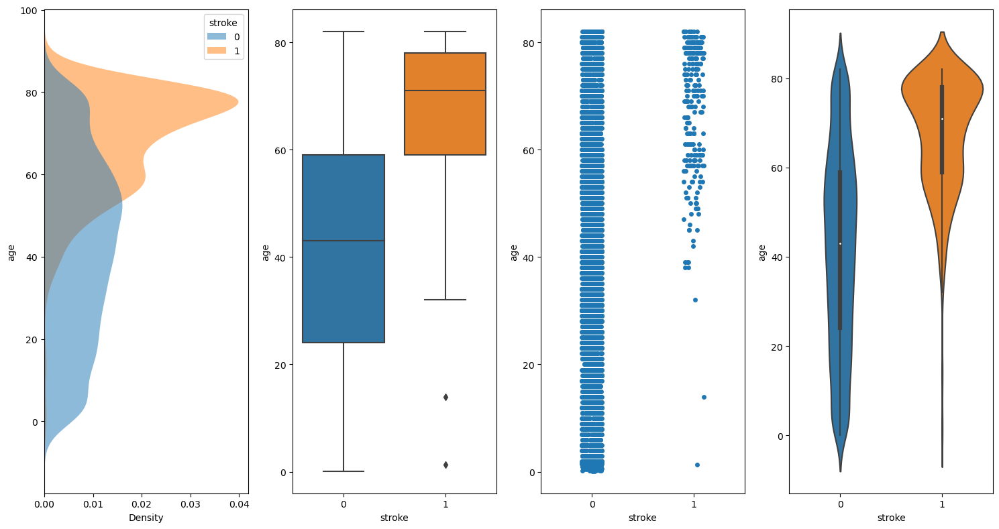

****************************************************
avg_glucose_level vs grupos de stroke
****************************************************
_________
ANOVA
_________
   Source            SS    DF             MS         F         p-unc      np2
0  stroke  1.823920e+05     1  182392.008675  90.50387  2.767811e-21  0.01741
1  Within  1.029413e+07  5108    2015.295141       NaN           NaN      NaN
                
_________________
Kruskall Wallis
_________________
         Source  ddof1          H         p-unc
Kruskal  stroke      1  34.807396  3.639881e-09


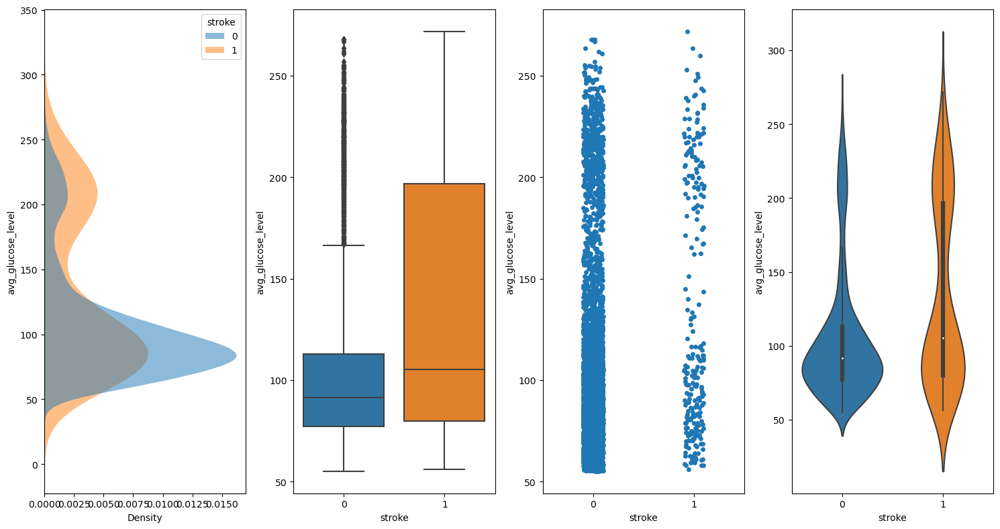

****************************************************
bmi vs grupos de stroke
****************************************************
_________
ANOVA
_________
   Source             SS    DF          MS       F     p-unc       np2
0  stroke     543.607833     1  543.607833  8.8265  0.002983  0.001796
1  Within  302213.067632  4907   61.588153     NaN       NaN       NaN
                
_________________
Kruskall Wallis
_________________
         Source  ddof1          H     p-unc
Kruskal  stroke      1  15.087653  0.000103


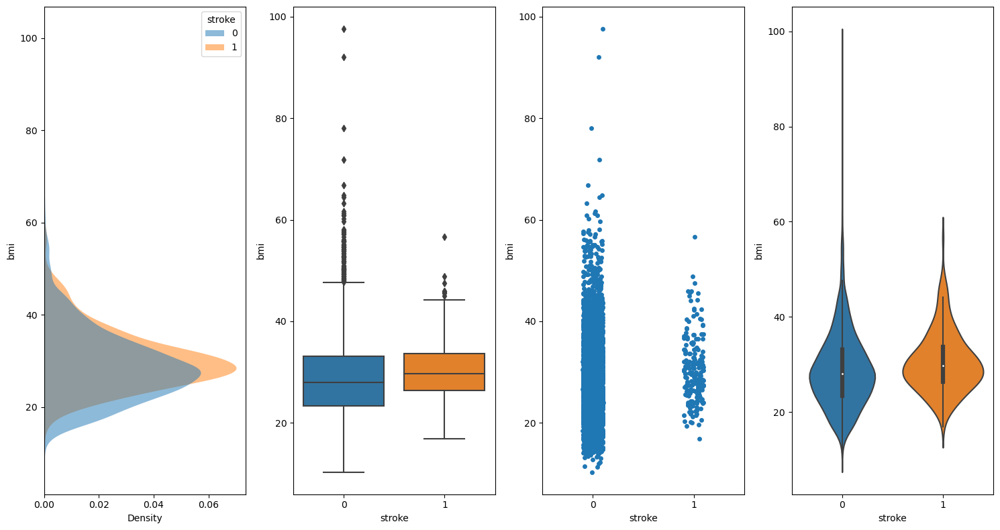

,Variable,ANOVA p-value,Kruskall Wallis p-value
0,age,7.030778e-71,3.725167e-71
1,avg_glucose_level,2.767811e-21,3.639881e-09
2,bmi,2.983269e-03,1.026324e-04


In [31]:
var_y = "stroke" # variable cualitativa fija (respuesta)
vec_var_num = ["age","avg_glucose_level","bmi"] # vector de los nombres de las variables cuantitativas de entrada

anova_df = pd.DataFrame(columns=["Variable","ANOVA p-value","Kruskall Wallis p-value"])

for i in vec_var_num:
    
    print("****************************************************")
    print(i + " vs grupos de " + var_y)
    print("****************************************************")
    print("_________")
    print("ANOVA")
    print("_________")
    
    #Calcular ANOVA para i vs var_y
    aov = pg.anova(dv=i, between=var_y, data=data,
                  detailed=True)
    
    print(aov)
    print("                ")
    print("_________________")
    print("Kruskall Wallis")
    print("_________________")
    
     #Calcular Kruskall Wallis para i vs var_y
    kruskal = pg.kruskal(dv=i, between=var_y, data=data)
    print(kruskal)
    
    # Se copian los p-valores que se calculan en el data frame:
    anova_df.loc[len(anova_df)]=[i,aov["p-unc"][0],kruskal["p-unc"][0]]
    
    #Grafico de comparación de medias
    y = var_y
    x = i
    
    fig, axs = plt.subplots(ncols=4, figsize=(15,8))
    sns.kdeplot(
        data=data, y=x, hue=y,
        fill=True, common_norm=False,
        alpha=.5, linewidth=0, ax=axs[0])
    sns.boxplot(data=data, y=x, x=y, ax=axs[1])
    sns.stripplot(y=x, data=data, x=y, ax=axs[2])
    sns.violinplot(data=data, y=x, x=y, ax=axs[3])
    fig.tight_layout()
    plt.show()
    
# Ordenar el dataframe de menor a mayor p-value:
    
anova_df = anova_df.sort_values(by="ANOVA p-value")
anova_df

##  Stroke (cualitativa) v/s las variables cualitativas --> comparación de proporciones (Chi-cuadrado)

Las hipotesis de este ejemplo parametrico son:

- H0: hay **igualdad** entre las proporciones de stroke en los grupos de hipertensión.
- H1: hay **diferencias** entre las proporciones de stroke en los grupos de hipertensión.
        
Se demuetsra que la variable hipertensión puede ser una variable a tener en cuenta en el modelo, porque tiene un p-valor significativo.

In [32]:
var_y = "stroke" # variable respuesta o los grupos que se quieren comparar
var_x = "hypertension" # variable de entrada

# Chi Cuadrado (cuanto de lejos estan del equilibrio, cuan relacionadas estan las variables):
chi2_res = pg.chi2_independence(data, x=var_x, y=var_y)

# Valores esperados o de equilibrio
chi2_res[0]

stroke,0,1
hypertension,,
0,4387.266536,224.733464
1,473.733464,24.266536


In [33]:
# Valores observados
chi2_res[1]

stroke,0,1
hypertension,,
0,4428.5,183.5
1,432.5,65.5


In [34]:
# los resultados de las tablas de chi cuadrado
chi2_res[2]

,test,lambda,chi2,dof,pval,cramer,power
0,pearson,1.000000,81.605368,1.0,1.661622e-19,0.126371,1.000000
1,cressie-read,0.666667,72.922988,1.0,1.348088e-17,0.119460,1.000000
2,log-likelihood,0.000000,59.769802,1.0,1.066269e-14,0.108151,1.000000
3,freeman-tukey,-0.500000,52.612863,1.0,4.062199e-13,0.101469,1.000000
4,mod-log-likelihood,-1.000000,47.113056,1.0,6.700785e-12,0.096020,1.000000
5,neyman,-2.000000,39.537634,1.0,3.217978e-10,0.087962,0.999992


****************************************************
gender vs stroke
****************************************************


C:\Users\valer\anaconda3\lib\site-packages\pingouin\contingency.py:150: UserWarning:

Low count on observed frequencies.

C:\Users\valer\anaconda3\lib\site-packages\pingouin\contingency.py:150: UserWarning:

Low count on expected frequencies.

C:\Users\valer\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:7421: RuntimeWarning:

divide by zero encountered in power

C:\Users\valer\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:7421: RuntimeWarning:

invalid value encountered in multiply

C:\Users\valer\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:7418: RuntimeWarning:

divide by zero encountered in divide



_________
Valores esperados
_________
stroke            0           1
gender                         
Female  2848.108415  145.891585
Male    2011.940313  103.059687
Other      0.951272    0.048728
_________
Valores observados
_________
stroke     0    1
gender           
Female  2853  141
Male    2007  108
Other      1    0
Chi cuadrado:
_________
                 test    lambda      chi2  dof      pval    cramer     power
0             pearson  1.000000  0.472587  2.0  0.789549  0.009617  0.087313
1        cressie-read  0.666667  0.481696  2.0  0.785961  0.009709  0.088067
2      log-likelihood  0.000000  0.519447  2.0  0.771265  0.010082  0.091203
3       freeman-tukey -0.500000       NaN  2.0       NaN       NaN       NaN
4  mod-log-likelihood -1.000000       inf  2.0  0.000000       inf       NaN
5              neyman -2.000000       NaN  2.0       NaN       NaN       NaN
_________
Frecuencias Condicionadas
_________
   stroke  gender  Frecuencia Condicionada
0       0  Female    

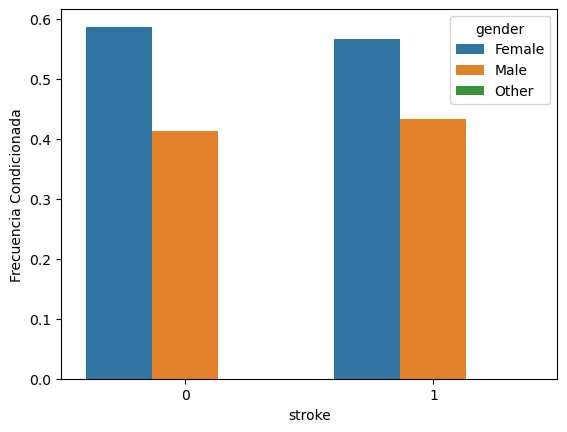

****************************************************
hypertension vs stroke
****************************************************
_________
Valores esperados
_________
stroke                  0           1
hypertension                         
0             4387.266536  224.733464
1              473.733464   24.266536
_________
Valores observados
_________
stroke             0      1
hypertension               
0             4428.5  183.5
1              432.5   65.5
Chi cuadrado:
_________
                 test    lambda       chi2  dof          pval    cramer  \
0             pearson  1.000000  81.605368  1.0  1.661622e-19  0.126371   
1        cressie-read  0.666667  72.922988  1.0  1.348088e-17  0.119460   
2      log-likelihood  0.000000  59.769802  1.0  1.066269e-14  0.108151   
3       freeman-tukey -0.500000  52.612863  1.0  4.062199e-13  0.101469   
4  mod-log-likelihood -1.000000  47.113056  1.0  6.700785e-12  0.096020   
5              neyman -2.000000  39.537634  1.0  3.21797

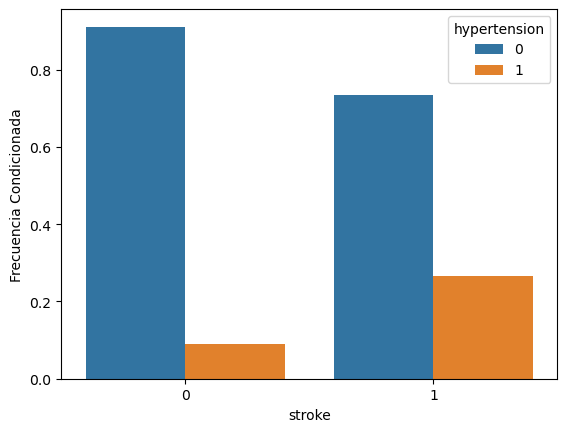

****************************************************
heart_disease vs stroke
****************************************************
_________
Valores esperados
_________
stroke                   0           1
heart_disease                         
0              4598.448924  235.551076
1               262.551076   13.448924
_________
Valores observados
_________
stroke              0      1
heart_disease               
0              4631.5  202.5
1               229.5   46.5
Chi cuadrado:
_________
                 test    lambda       chi2  dof          pval    cramer  \
0             pearson  1.000000  90.259561  1.0  2.088785e-21  0.132903   
1        cressie-read  0.666667  77.193504  1.0  1.550025e-18  0.122908   
2      log-likelihood  0.000000  58.724436  1.0  1.813748e-14  0.107201   
3       freeman-tukey -0.500000  49.412060  1.0  2.074663e-12  0.098335   
4  mod-log-likelihood -1.000000  42.639610  1.0  6.581308e-11  0.091347   
5              neyman -2.000000  33.882000  1.0

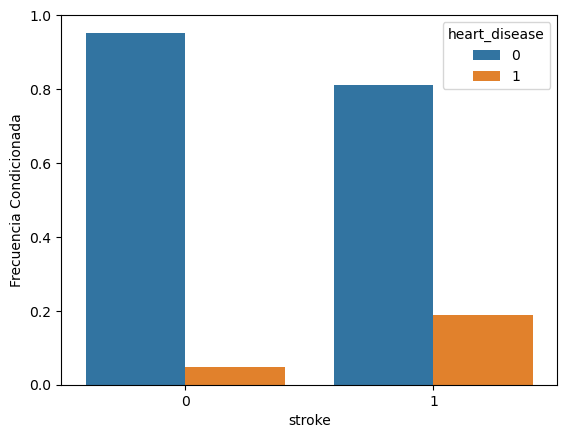

****************************************************
ever_married vs stroke
****************************************************
_________
Valores esperados
_________
stroke                  0           1
ever_married                         
No            1671.384932   85.615068
Yes           3189.615068  163.384932
_________
Valores observados
_________
stroke             0      1
ever_married               
No            1727.5   29.5
Yes           3133.5  219.5
Chi cuadrado:
_________
                 test    lambda        chi2  dof          pval    cramer  \
0             pearson  1.000000   58.923890  1.0  1.638902e-14  0.107383   
1        cressie-read  0.666667   61.812674  1.0  3.777352e-15  0.109984   
2      log-likelihood  0.000000   69.605351  1.0  7.244010e-17  0.116711   
3       freeman-tukey -0.500000   77.800567  1.0  1.139875e-18  0.123390   
4  mod-log-likelihood -1.000000   88.805989  1.0  4.354954e-21  0.131829   
5              neyman -2.000000  123.915917  1.0  

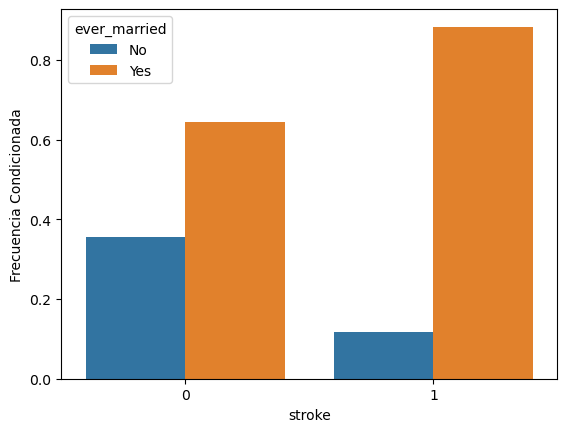

****************************************************
work_type vs stroke
****************************************************
_________
Valores esperados
_________
stroke                   0           1
work_type                             
Govt_job        624.985714   32.014286
Never_worked     20.927984    1.072016
Private        2782.470646  142.529354
Self-employed   779.091781   39.908219
children        653.523875   33.476125
_________
Valores observados
_________
stroke            0    1
work_type               
Govt_job        624   33
Never_worked     22    0
Private        2776  149
Self-employed   754   65
children        685    2
Chi cuadrado:
_________
                 test    lambda       chi2  dof          pval    cramer  \
0             pearson  1.000000  49.163512  4.0  5.397708e-10  0.098087   
1        cressie-read  0.666667  53.575137  4.0  6.458884e-11  0.102393   
2      log-likelihood  0.000000  69.755866  4.0  2.555839e-14  0.116837   
3       freeman-tukey -0.

C:\Users\valer\anaconda3\lib\site-packages\pingouin\contingency.py:150: UserWarning:

Low count on observed frequencies.

C:\Users\valer\anaconda3\lib\site-packages\pingouin\contingency.py:150: UserWarning:

Low count on expected frequencies.

C:\Users\valer\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:7421: RuntimeWarning:

divide by zero encountered in power

C:\Users\valer\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:7421: RuntimeWarning:

invalid value encountered in multiply

C:\Users\valer\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:7418: RuntimeWarning:

divide by zero encountered in divide



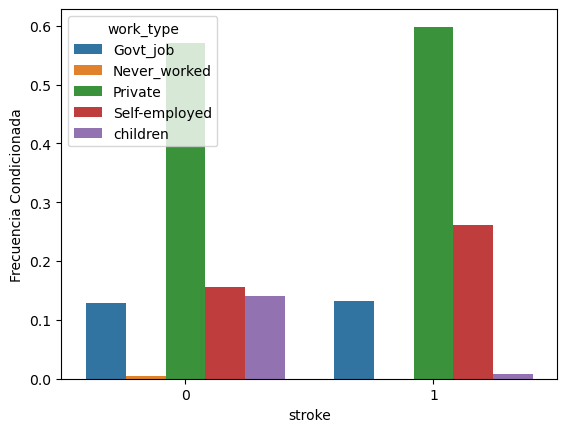

****************************************************
Residence_type vs stroke
****************************************************
_________
Valores esperados
_________
stroke                    0           1
Residence_type                         
Rural           2391.497847  122.502153
Urban           2469.502153  126.497847
_________
Valores observados
_________
stroke               0      1
Residence_type               
Rural           2399.5  114.5
Urban           2461.5  134.5
Chi cuadrado:
_________
                 test    lambda      chi2  dof      pval    cramer     power
0             pearson  1.000000  1.081637  1.0  0.298332  0.014549  0.180150
1        cressie-read  0.666667  1.082030  1.0  0.298244  0.014552  0.180199
2      log-likelihood  0.000000  1.083055  1.0  0.298015  0.014558  0.180326
3       freeman-tukey -0.500000  1.084032  1.0  0.297797  0.014565  0.180446
4  mod-log-likelihood -1.000000  1.085190  1.0  0.297539  0.014573  0.180589
5              neyman -2.0

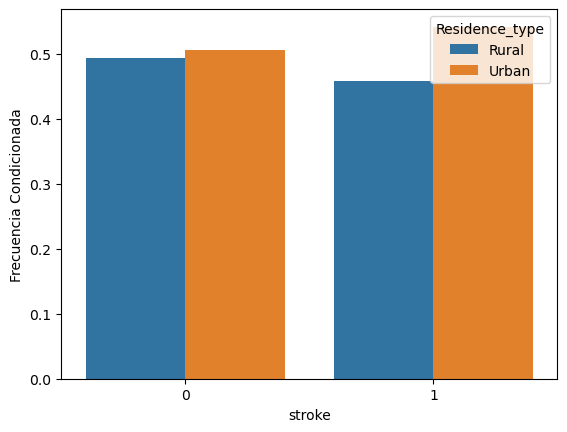

****************************************************
smoking_status vs stroke
****************************************************
_________
Valores esperados
_________
stroke                     0          1
smoking_status                         
Unknown          1468.763992  75.236008
formerly smoked   841.875734  43.124266
never smoked     1799.806654  92.193346
smokes            750.553620  38.446380
_________
Valores observados
_________
stroke              0   1
smoking_status           
Unknown          1497  47
formerly smoked   815  70
never smoked     1802  90
smokes            747  42
Chi cuadrado:
_________
                 test    lambda       chi2  dof      pval    cramer     power
0             pearson  1.000000  29.147269  3.0  0.000002  0.075525  0.997878
1        cressie-read  0.666667  28.684221  3.0  0.000003  0.074922  0.997580
2      log-likelihood  0.000000  28.110054  3.0  0.000003  0.074169  0.997155
3       freeman-tukey -0.500000  27.975266  3.0  0.000004  0

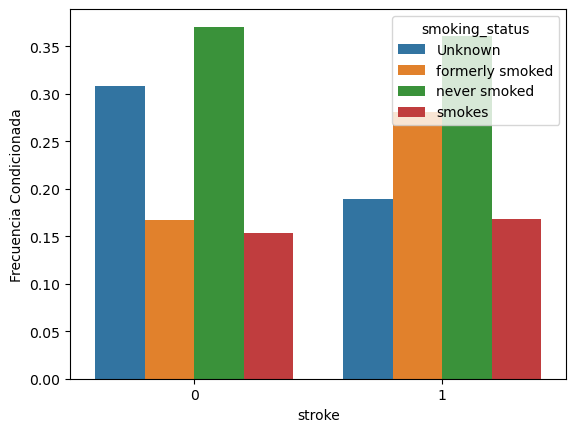

                                         
Resumen de todos los test de chi cuadrado
                                         


,Variable,Chi2 Pearson p-value,Chi2 log-likelihood p-value
2,heart_disease,2.088785e-21,1.813748e-14
1,hypertension,1.661622e-19,1.066269e-14
3,ever_married,1.638902e-14,7.244010e-17
4,work_type,5.397708e-10,2.555839e-14
6,smoking_status,2.085400e-06,3.443888e-06
5,Residence_type,2.983317e-01,2.980151e-01
0,gender,7.895491e-01,7.712650e-01


In [35]:
# Gráficos de barras de dos factores de frecuencias condicionadas a los grupos de la variable x

x="stroke" # variable de salida
# se definen variables cualitativas de entrada
vec_y = ["gender","hypertension","heart_disease","ever_married","work_type","Residence_type","smoking_status"]

chi2_df = pd.DataFrame(columns=["Variable","Chi2 Pearson p-value","Chi2 log-likelihood p-value"])

for i in vec_y:
    
    y = i
    print("****************************************************")
    print(y + " vs " + x)
    print("****************************************************")
    
    # Chi Cuadrado:
    chi2_res = pg.chi2_independence(data, x=y, y=x)
    print("_________")
    print("Valores esperados")
    print("_________")
    print(chi2_res[0])
    print("_________")
    print("Valores observados")
    print("_________")
    print(chi2_res[1])
    print("Chi cuadrado:")
    print("_________")
    print(chi2_res[2])
    print("_________")
    print("Frecuencias Condicionadas")
    print("_________")
    #Tabla de frecuencias condicionadas:
    pct2 = (data.groupby([x,y]).size() / data.groupby([x]).size()).reset_index().rename({0:"Frecuencia Condicionada"}, axis=1)
    print(pct2)
    print("                 ")
    print("_________________")
    print("Gráfico de barras")
    print("_________________")
    #Gráfico de barras de las frecuencias condicionadas:
    sns.barplot(x=x, hue=y, y="Frecuencia Condicionada", data=pct2)
    plt.show()
    
    # Se guardan los valores de chi cuadrado:
    # Se copian los p-values que se calcularon en el dataframe:
    chi2_df.loc[len(chi2_df)]=[i,chi2_res[2]["pval"][0], chi2_res[2]["pval"][2]]

print("                                         ")
print("Resumen de todos los test de chi cuadrado")
print("                                         ")    
# Se ordena el dataframe de menor a mayor p-valor:
chi2_df = chi2_df.sort_values(by="Chi2 Pearson p-value")
chi2_df

## NO BALANCEADO - Modelo estadistico (causalidad) - Modelo Logístico

Uno de los temas mas importantes es el feature selection en los modelos estadísticos. Es decir, qué variables son las representativas

e importantes en el sistema que se está modelando. Ahora lo que se realizará es seleccionar las variables de forma manual. La idea es 

ir quitando aquellas variables que no son significativas, es decir, con p-values altos.

In [ ]:
# Se seleccionan las variables de las cuales no se tenian patrones:
var_x = ["age",
        "hypertension",
        "heart_disease",
        "ever_married",
        "work_type",
        #"Residence_type",
        "avg_glucose_level",
        "bmi",
        "smoking_status"]

X = data[var_x]
X

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                "ever_married",
                "work_type",
                #"Residence_type",
                "smoking_status"]

X = pd.get_dummies(X, columns=var_x_object)

var_x_drop = ["hypertension_0", "ever_married_No", "heart_disease_0", "work_type_children", "work_type_Never_worked"]
X = X.drop(columns =var_x_drop)
X.head()

In [39]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             5110 non-null   float64
 1   avg_glucose_level               5110 non-null   float64
 2   bmi                             4909 non-null   float64
 3   hypertension_1                  5110 non-null   uint8  
 4   heart_disease_1                 5110 non-null   uint8  
 5   ever_married_Yes                5110 non-null   uint8  
 6   work_type_Govt_job              5110 non-null   uint8  
 7   work_type_Private               5110 non-null   uint8  
 8   work_type_Self-employed         5110 non-null   uint8  
 9   smoking_status_Unknown          5110 non-null   uint8  
 10  smoking_status_formerly smoked  5110 non-null   uint8  
 11  smoking_status_never smoked     5110 non-null   uint8  
 12  smoking_status_smokes           51

In [51]:
# Se seleccionan las variables de las cuales no se tenian patrones:
var_x = ["age",
        "hypertension",
        "heart_disease",
        "ever_married",
        "work_type",
        #"Residence_type",
        "avg_glucose_level",
        "bmi",
        "smoking_status"]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                "ever_married",
                "work_type",
                #"Residence_type",
                "smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

y = data["stroke"] #variable de salida

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "ever_married_No", "heart_disease_0", "work_type_children", "work_type_Never_worked"]
X = X.drop(columns =var_x_drop)
X.head()


# Se convierten las variables binarias en numeros enteros para evitar problemas al correr la regresión:
X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
X["ever_married_Yes"] = X["ever_married_Yes"].astype("int64")
X["work_type_Govt_job"] = X["work_type_Govt_job"].astype("int64")
X["work_type_Private"] = X["work_type_Private"].astype("int64")
X["work_type_Self-employed"] = X["work_type_Self-employed"].astype("int64")
X["smoking_status_Unknown"] = X["smoking_status_Unknown"].astype("int64")
X["smoking_status_formerly smoked"] = X["smoking_status_formerly smoked"].astype("int64")
X["smoking_status_never smoked"] = X["smoking_status_never smoked"].astype("int64")
X["smoking_status_smokes"] = X["smoking_status_smokes"].astype("int64")

# Modelo logistico con statsmodel:
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

         Current function value: 0.138866
         Iterations: 35


C:\Users\valer\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 stroke   No. Observations:                 4909
Model:                          Logit   Df Residuals:                     4896
Method:                           MLE   Df Model:                           12
Date:                Fri, 05 May 2023   Pseudo R-squ.:                  0.2112
Time:                        16:19:22   Log-Likelihood:                -681.69
converged:                      False   LL-Null:                       -864.19
Covariance Type:            nonrobust   LLR p-value:                 9.561e-71
==================================================================================================
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -5.9529        nan        nan        nan         nan         nan
age                                0.0735      0.006     11.599      0.000       0.061       0.086
avg_glucose_level                  0.0046      0.001      3.599      0.000       0.002       0.007
bmi                                0.0041      0.012      0.341      0.733      -0.019       0.027
hypertension_1                     0.5251      0.175      3.000      0.003       0.182       0.868
heart_disease_1                    0.3465      0.206      1.683      0.092      -0.057       0.750
ever_married_Yes                  -0.1161      0.247     -0.470      0.638      -0.600       0.368
work_type_Govt_job                -0.6090      1.111     -0.548      0.584      -2.787       1.569
work_type_Private                 -0.4487      1.097     -0.409      0.683      -2.600       1.702
work_type_Self-employed           -0.8735      1.116     -0.783      0.434      -3.061       1.314
smoking_status_Unknown            -1.7550        nan        nan        nan         nan         nan
smoking_status_formerly smoked    -1.4824        nan        nan        nan         nan         nan
smoking_status_never smoked       -1.5480        nan        nan        nan         nan         nan
smoking_status_smokes             -1.1677        nan        nan        nan         nan         nan
==================================================================================================
"""

In [46]:
# Se convierte la variable smoke a ordinal ya que el modelo no converge correctamente añadiendo smoke status

data["smoking"] = 0
data["smoking"].loc[data["smoking_status"]=="never smoked"]=1
data["smoking"].loc[data["smoking_status"]=="formerly smoked"]=2
data["smoking"].loc[data["smoking_status"]=="status_smokes"]=3

data.head()

C:\Users\valer\AppData\Local\Temp\ipykernel_5976\1032530210.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\valer\AppData\Local\Temp\ipykernel_5976\1032530210.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\valer\AppData\Local\Temp\ipykernel_5976\1032530210.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,smoking
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,2
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,0
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,1
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,2


In [49]:
# Se añade smoking como nueva variable ordinal:

# Se quita work_type ya que no es significativo y con ello ver el efecto de smoking status:

# Se seleccionan las variables de las cuales no se tenian patrones:
var_x = ["age",
        "hypertension",
        "heart_disease",
        "ever_married",
        "work_type",
        #"Residence_type",
        "avg_glucose_level",
        "bmi",
        "smoking"]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                "ever_married",
                "work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

y = data["stroke"] #variable de salida

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "ever_married_No", "heart_disease_0", "work_type_children", "work_type_Never_worked"]
X = X.drop(columns =var_x_drop)
X.head()

# Modelo logistico con statsmodel:

X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
X["ever_married_Yes"] = X["ever_married_Yes"].astype("int64")
X["work_type_Govt_job"] = X["work_type_Govt_job"].astype("int64")
X["work_type_Private"] = X["work_type_Private"].astype("int64")
X["work_type_Self-employed"] = X["work_type_Self-employed"].astype("int64")

           
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.139396
         Iterations 11


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 stroke   No. Observations:                 4909
Model:                          Logit   Df Residuals:                     4898
Method:                           MLE   Df Model:                           10
Date:                Fri, 05 May 2023   Pseudo R-squ.:                  0.2082
Time:                        16:13:42   Log-Likelihood:                -684.30
converged:                       True   LL-Null:                       -864.19
Covariance Type:            nonrobust   LLR p-value:                 3.319e-71
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -7.6427      1.036     -7.379      0.000      -9.673      -5.613
age                         0.0720      0.006     11.549      0.000       0.060       0.084
avg_glucose_level           0.0047      0.001      3.623      0.000       0.002       0.007
bmi                         0.0037      0.012      0.317      0.752      -0.019       0.027
smoking                    -0.0148      0.099     -0.149      0.881      -0.209       0.180
hypertension_1              0.5460      0.174      3.130      0.002       0.204       0.888
heart_disease_1             0.3847      0.205      1.880      0.060      -0.016       0.786
ever_married_Yes           -0.1051      0.246     -0.427      0.670      -0.588       0.378
work_type_Govt_job         -0.3161      1.100     -0.287      0.774      -2.471       1.839
work_type_Private          -0.1600      1.086     -0.147      0.883      -2.289       1.969
work_type_Self-employed    -0.5887      1.105     -0.533      0.594      -2.754       1.577
===========================================================================================
"""

In [57]:
# Se quita work_type ya que no es significativo y con ello ver el efecto de smoking status:

# Se seleccionan las variables de las cuales no se tenian patrones:
var_x = ["age",
        "hypertension",
        "heart_disease",
        "ever_married",
        #"work_type",
        #"Residence_type",
        "avg_glucose_level",
        "bmi",
        "smoking"
        ]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                "ever_married",
                #"work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

y = data["stroke"] #variable de salida

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "ever_married_No", "heart_disease_0"]
X = X.drop(columns =var_x_drop)
X.head()

# Modelo logistico con statsmodel:

X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
X["ever_married_Yes"] = X["ever_married_Yes"].astype("int64")
           
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.139985
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 stroke   No. Observations:                 4909
Model:                          Logit   Df Residuals:                     4901
Method:                           MLE   Df Model:                            7
Date:                Fri, 05 May 2023   Pseudo R-squ.:                  0.2048
Time:                        16:26:15   Log-Likelihood:                -687.19
converged:                       True   LL-Null:                       -864.19
Covariance Type:            nonrobust   LLR p-value:                 1.703e-72
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -7.7202      0.556    -13.886      0.000      -8.810      -6.631
age                   0.0683      0.006     11.869      0.000       0.057       0.080
avg_glucose_level     0.0048      0.001      3.686      0.000       0.002       0.007
bmi                   0.0038      0.012      0.327      0.744      -0.019       0.027
smoking              -0.0193      0.099     -0.195      0.845      -0.213       0.175
hypertension_1        0.5355      0.174      3.077      0.002       0.194       0.877
heart_disease_1       0.4024      0.204      1.974      0.048       0.003       0.802
ever_married_Yes     -0.0924      0.242     -0.382      0.703      -0.567       0.382
=====================================================================================
"""

In [58]:
# Se elimina variable bmi, ever-married, work_type:
# Se seleccionan las variables de las cuales no se tenian patrones:
var_x = ["age",
        "hypertension",
        "heart_disease",
        #"ever_married",
        #"work_type",
        #"Residence_type",
        "avg_glucose_level",
        #"bmi",
        #"smoking"
        
        ]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                #"ever_married",
                #"work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

y = data["stroke"] #variable de salida

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "heart_disease_0"]
X = X.drop(columns =var_x_drop)
X.head()

# Modelo logistico con statsmodel:

X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
           
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

Optimization terminated successfully.
         Current function value: 0.140013
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 stroke   No. Observations:                 4909
Model:                          Logit   Df Residuals:                     4904
Method:                           MLE   Df Model:                            4
Date:                Fri, 05 May 2023   Pseudo R-squ.:                  0.2047
Time:                        16:26:22   Log-Likelihood:                -687.32
converged:                       True   LL-Null:                       -864.19
Covariance Type:            nonrobust   LLR p-value:                 2.736e-75
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -7.6607      0.387    -19.786      0.000      -8.420      -6.902
age                   0.0675      0.006     12.123      0.000       0.057       0.078
avg_glucose_level     0.0048      0.001      3.828      0.000       0.002       0.007
hypertension_1        0.5396      0.173      3.118      0.002       0.200       0.879
heart_disease_1       0.4043      0.203      1.987      0.047       0.006       0.803
=====================================================================================
"""

Al tener ya el modleo con aquellas variables significativas que pueden entregar información de la respuestan de forma que todas presentan p-values significativos.

Se calcula el error que comete el modelo con la matriz de confusión.

In [63]:
# performing predictions on the test dataset
yhat = logit_model.predict()
prediction = list(map(round,yhat))

print("Predicción de Validación:")
print(skm.accuracy_score(y, prediction)) # calcula la probabilidad de acierto
print(np.transpose(skm.confusion_matrix(y, prediction))) # todos los valores de la muestra dicen que no tienen stroke
print(skm.classification_report(prediction, y))
print("******************************************")

# La muestra está calculando con datos muy desbalanceados
# El modelo no sirve dado que en precisión, se puede ver que el no tener stroke da un 100% y tenerlo da un 0%.

Predicción de Validación:
0.9574251375025463
[[4700  209]
 [   0    0]]


C:\Users\valer\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



              precision    recall  f1-score   support

           0       1.00      0.96      0.98      4909
           1       0.00      0.00      0.00         0

    accuracy                           0.96      4909
   macro avg       0.50      0.48      0.49      4909
weighted avg       1.00      0.96      0.98      4909

******************************************


C:\Users\valer\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

C:\Users\valer\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



## BALANCEADO - Modelo estadistico (causalidad) - Modelo Logístico

Este sistema ayuda a balancear el problema. En el proceso de balanceo existen varios tipos que se pueden aplicar. En este ejemplo se han implementado 5:

- 1 -> under sampling
- 2 -> over sampling
- 3 -> SMOTE (es under y over sampling)
- 4 -> SMOTE con corrección 1
- 5 -> SMOTE con corrección 2

### Under Sampling

Se quitan muestras del grupo más grande hasta igualar el grupo más pequeño. (SON DATOS REALES)

Si se realiza **under sampling**, es decir, se quitan datos de stroke = 0 para igualar los grupos, el resultado es el siguiente:

In [16]:
# Se seleccionan las variables de entrada y salida:

# se quitan aquellas variables que no tenían patrones:
var_x = [#"gender",
        "age",
        "hypertension",
        "heart_disease",
        #"ever_married",
        #"work_type",
        #"Residence_type",
        "avg_glucose_level",
        #"bmi",
        "smoking"
        ]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

y = data["stroke"] #variable de salida

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                #"ever_married",
                #"work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "heart_disease_0"]
X = X.drop(columns =var_x_drop)
X.head()

# Se balancean los datos:
balanceo = True # se entrega la opción de que sí balancee los datos
tipo_balanceo=4 # se entrga el tipo de balanceo

# 1 -> under sampling
# 2 -> over sampling
# 3 -> SMOTE (es under y over sampling)
# 4 -> SMOTE con corrección 1
# 5 -> SMOTE con corrección 2

if balanceo:
    # Se copia en un nuevo dataframe los datos originales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum ["idx"] = idx
    X_dum.head()
    
    Y_dum = y.copy()
    
    #Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek
    
    if tipo_balanceo == 1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo == 2:
        rus = RandomOverSampler(random_state=0)
    if tipo_balanceo == 3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo == 4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo == 5:
        rus = SMOTETomek(random_state=0)
    
    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(["idx"],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b, columns=[var_y])
    
    #Barplot de la variable output - frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y, data=y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

    
# Modelo logistico con statsmodel:

X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
           
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

KeyError: "['smoking'] not in index"

In [65]:
# performing predictions on the test dataset
yhat = logit_model.predict()
prediction = list(map(round,yhat))

print("Predicción de Validación:")
print(skm.accuracy_score(y, prediction)) # calcula la probabilidad de acierto
print(np.transpose(skm.confusion_matrix(y, prediction))) # todos los valores de la muestra dicen que no tienen stroke
print(skm.classification_report(prediction, y))
print("******************************************")

Predicción de Validación:
0.7799043062200957
[[157  40]
 [ 52 169]]
              precision    recall  f1-score   support

           0       0.75      0.80      0.77       197
           1       0.81      0.76      0.79       221

    accuracy                           0.78       418
   macro avg       0.78      0.78      0.78       418
weighted avg       0.78      0.78      0.78       418

******************************************


El acierto es un 81% aproximadamente para aquellos que tienen stroke, lo que indica que se está acercando a un clasificador más o menos decente (acertado).

### Over Sampling

Se crean nuevas observaciones para igualar el numero de muestras. Entonces, el grupo pequeño crece.

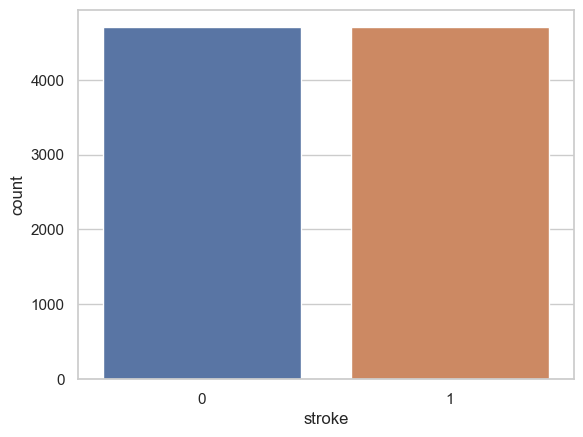

Optimization terminated successfully.
         Current function value: 0.472269
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                 stroke   No. Observations:                 9400
Model:                          Logit   Df Residuals:                     9394
Method:                           MLE   Df Model:                            5
Date:                Fri, 05 May 2023   Pseudo R-squ.:                  0.3187
Time:                        17:40:52   Log-Likelihood:                -4439.3
converged:                       True   LL-Null:                       -6515.6
Covariance Type:            nonrobust   LLR p-value:                     0.000
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -4.8401      0.116    -41.890      0.000      -5.067      -4.614
age                   0.0726      0.002     40.402      0.000       0.069       0.076
avg_glucose_level     0.0051      0.000     10.289      0.000       0.004       0.006
smoking              -0.0735      0.035     -2.114      0.035      -0.142      -0.005
hypertension_1        0.6599      0.070      9.383      0.000       0.522       0.798
heart_disease_1       0.3716      0.090      4.137      0.000       0.196       0.548
=====================================================================================
"""

In [68]:
# Se seleccionan las variables de entrada y salida:

# se quitan aquellas variables que no tenían patrones:
var_x = [#"gender",
        "age",
        "hypertension",
        "heart_disease",
        #"ever_married",
        #"work_type",
        #"Residence_type",
        "avg_glucose_level",
        #"bmi",
        "smoking"
        ]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

y = data["stroke"] #variable de salida

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                #"ever_married",
                #"work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "heart_disease_0"]
X = X.drop(columns =var_x_drop)
X.head()

# Se balancean los datos:
balanceo = True # se entrega la opción de que sí balancee los datos
tipo_balanceo=2 # se entrga el tipo de balanceo

# 1 -> under sampling
# 2 -> over sampling
# 3 -> SMOTE (es under y over sampling)
# 4 -> SMOTE con corrección 1
# 5 -> SMOTE con corrección 2

if balanceo:
    # Se copia en un nuevo dataframe los datos originales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum ["idx"] = idx
    X_dum.head()
    
    Y_dum = y.copy()
    
    #Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek
    
    if tipo_balanceo == 1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo == 2:
        rus = RandomOverSampler(random_state=0)
    if tipo_balanceo == 3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo == 4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo == 5:
        rus = SMOTETomek(random_state=0)
    
    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(["idx"],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b, columns=[var_y])
    
    #Barplot de la variable output - frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y, data=y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

    
# Modelo logistico con statsmodel:

X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
           
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

In [69]:
# performing predictions on the test dataset
yhat = logit_model.predict()
prediction = list(map(round,yhat))

print("Predicción de Validación:")
print(skm.accuracy_score(y, prediction)) # calcula la probabilidad de acierto
print(np.transpose(skm.confusion_matrix(y, prediction))) # todos los valores de la muestra dicen que no tienen stroke
print(skm.classification_report(prediction, y))
print("******************************************")

Predicción de Validación:
0.7695744680851064
[[3491  957]
 [1209 3743]]
              precision    recall  f1-score   support

           0       0.74      0.78      0.76      4448
           1       0.80      0.76      0.78      4952

    accuracy                           0.77      9400
   macro avg       0.77      0.77      0.77      9400
weighted avg       0.77      0.77      0.77      9400

******************************************


### SMOTE con corrección 1

In [ ]:
# Se seleccionan las variables de entrada y salida:

# se quitan aquellas variables que no tenían patrones:
var_x = [#"gender",
        "age",
        "hypertension",
        "heart_disease",
        #"ever_married",
        #"work_type",
        #"Residence_type",
        "avg_glucose_level",
        #"bmi",
        "smoking"
        ]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

y = data["stroke"] #variable de salida

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                #"ever_married",
                #"work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "heart_disease_0"]
X = X.drop(columns =var_x_drop)
X.head()

# Se balancean los datos:
balanceo = True # se entrega la opción de que sí balancee los datos
tipo_balanceo=2 # se entrga el tipo de balanceo

# 1 -> under sampling
# 2 -> over sampling
# 3 -> SMOTE (es under y over sampling)
# 4 -> SMOTE con corrección 1
# 5 -> SMOTE con corrección 2

if balanceo:
    # Se copia en un nuevo dataframe los datos originales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum ["idx"] = idx
    X_dum.head()
    
    Y_dum = y.copy()
    
    #Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek
    
    if tipo_balanceo == 1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo == 2:
        rus = RandomOverSampler(random_state=0)
    if tipo_balanceo == 3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo == 4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo == 5:
        rus = SMOTETomek(random_state=0)
    
    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(["idx"],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b, columns=[var_y])
    
    #Barplot de la variable output - frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y, data=y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

    
# Modelo logistico con statsmodel:

X["hypertension_1"] = X["hypertension_1"].astype("int64") 
X["heart_disease_1"] = X["heart_disease_1"].astype("int64") 
           
logit_model = sm.Logit(y, sm.add_constant(X)).fit()
logit_model.summary()

In [71]:
# performing predictions on the test dataset
yhat = logit_model.predict()
prediction = list(map(round,yhat))

print("Predicción de Validación:")
print(skm.accuracy_score(y, prediction)) # calcula la probabilidad de acierto
print(np.transpose(skm.confusion_matrix(y, prediction))) # todos los valores de la muestra dicen que no tienen stroke
print(skm.classification_report(prediction, y))
print("******************************************")

Predicción de Validación:
0.8679601185664242
[[2832  407]
 [ 573 3610]]
              precision    recall  f1-score   support

           0       0.83      0.87      0.85      3239
           1       0.90      0.86      0.88      4183

    accuracy                           0.87      7422
   macro avg       0.87      0.87      0.87      7422
weighted avg       0.87      0.87      0.87      7422

******************************************


# Árboles de Decisión 

Tanto el modelo logístico (modelo estadístico) como el que se calculará a continuación, el árbol de decisión son ideales para poder
interpretar el problema. Son dos los métodos que se utilizan antes de calcular un algoritmo ya que ayudan a entender el problema.

El árbol de decisión es un algoritmo clasificador de Machine Learning que tienen como ventaja sus mapas tipo árbol que son autoexplicativos
y muy interesantes a la hora de presentar resultados. Una de las desventajas de los árboles de decisión es que estos tienden al 
overfitting, es decir, tienden a buscar el error 0 y no generalizan bien.

Para evitar este error, se separa el dataframe en datos ***training*** y ***test*** (split data) para calcular el error por datos de validación
y de trainig.

A continuación, se balancean los datos con **down sampling** para solo tomar datos reales y así interpretar los resultados.

##### Down Sampling

C:\Users\valer\AppData\Local\Temp\ipykernel_1364\3793416252.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["smoking"].loc[data["smoking_status"]=="never smoked"]=1
C:\Users\valer\AppData\Local\Temp\ipykernel_1364\3793416252.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["smoking"].loc[data["smoking_status"]=="formerly smoked"]=2
C:\Users\valer\AppData\Local\Temp\ipykernel_1364\3793416252.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning

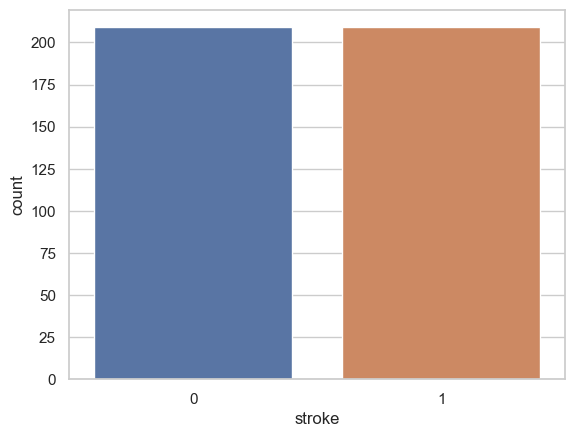

In [24]:
# Se convierte la variable smoke a ordinal ya que el modelo no converge correctamente añadiendo smoke status

data["smoking"] = 0
data["smoking"].loc[data["smoking_status"]=="never smoked"]=1
data["smoking"].loc[data["smoking_status"]=="formerly smoked"]=2
data["smoking"].loc[data["smoking_status"]=="status_smokes"]=3

# Se seleccionan las variables de entrada y salida:

# Se seleccionan las variables de entrada y salida:

# se quitan aquellas variables que no tenían patrones:
var_y = "stroke"
var_x = [#"gender",
        "age",
        "hypertension",
        "heart_disease",
        #"ever_married",
        "work_type",
        #"Residence_type",
        "avg_glucose_level",
        #"bmi",
        "smoking"
        ]

X = data[var_x] # x mayuscula porque es una matriz, es decir, un data frame

y = data["stroke"] #variable de salida

# Se crea una variable dummy para las variables objeto para poder utilizarlos en los modelos logisticos:
var_x_object = [#"gender",
                "hypertension",
                "heart_disease",
                #"ever_married",
                "work_type",
                #"Residence_type",
                #"smoking_status"
                ]

X = pd.get_dummies(X, columns=var_x_object)

# Se quitan las variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = ["hypertension_0", "heart_disease_0", "work_type_Never_worked", "work_type_children"]
X = X.drop(columns =var_x_drop)
X.head()

# Se balancean los datos:
balanceo = True # se entrega la opción de que sí balancee los datos
tipo_balanceo=1 # se entrga el tipo de balanceo

# 1 -> under sampling
# 2 -> over sampling
# 3 -> SMOTE (es under y over sampling)
# 4 -> SMOTE con corrección 1
# 5 -> SMOTE con corrección 2

if balanceo:
    # Se copia en un nuevo dataframe los datos originales para entrenar
    X_dum = X.copy()
    idx = X.index
    X_dum ["idx"] = idx
    X_dum.head()
    
    Y_dum = y.copy()
    
    #Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek
    
    if tipo_balanceo == 1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo == 2:
        rus = RandomOverSampler(random_state=0)
    if tipo_balanceo == 3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo == 4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo == 5:
        rus = SMOTETomek(random_state=0)
    
    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(["idx"],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b, columns=[var_y])
    
    #Barplot de la variable output - frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y, data=y_b_df)
    plt.show()
    
    X = X_b.copy()
    y = y_b.copy()

    

In [25]:
# Variables de entrada del árbol:
X.columns

Index(['age', 'avg_glucose_level', 'smoking', 'hypertension_1',
       'heart_disease_1', 'work_type_Govt_job', 'work_type_Private',
       'work_type_Self-employed'],
      dtype='object')

## Árbol por defecto

No defino ninguna condición de pre podado.
Ponemos las condiciones por defecto que tenemos en este enlace: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html

In [38]:
# Creación del modelo
#-------------------------------------------------
modelo_defecto = sklearn.tree.DecisionTreeClassifier(
            #max_depth = 5,
            #min_samples_leaf = 10,
            criterion = "gini",
            random_state = 123
            )

# Entrenamiento del modelo
#-------------------------------------------------
modelo_defecto.fit(X,y)

DecisionTreeClassifier(random_state=123)

Profundidad del árbol: 16
Número de nodos terminales: 123


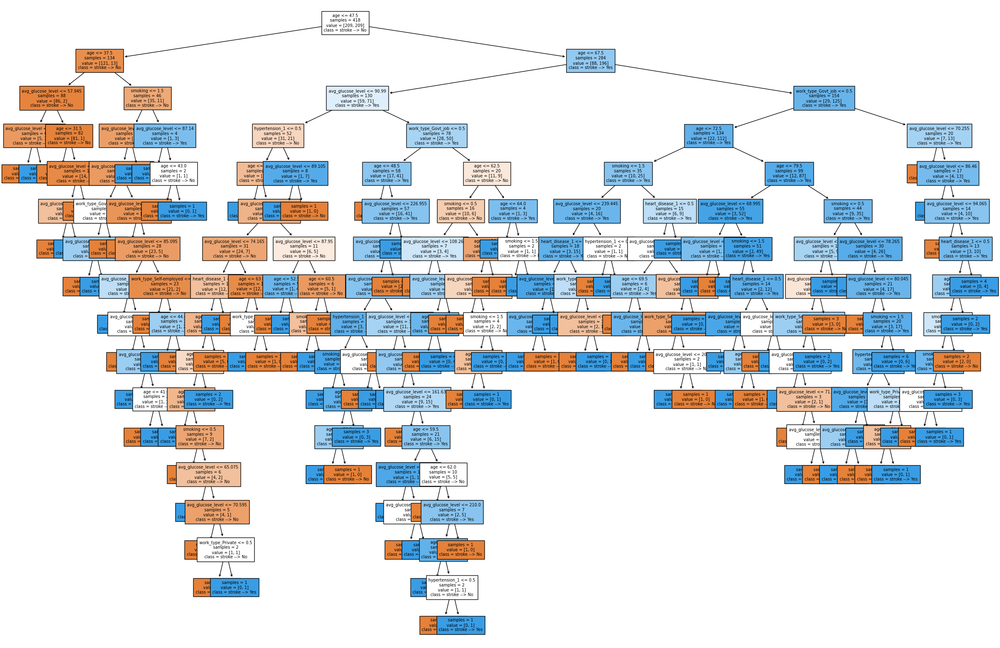

In [39]:
# Estructura del árbol creado
#-------------------------------------------------
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text

#-------------------------------------------------
sns.reset_defaults()
fig, ax = plt.subplots(figsize=(30,20))

print(f"Profundidad del árbol: {modelo_defecto.get_depth()}")
print(f"Número de nodos terminales: {modelo_defecto.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo_defecto,
            feature_names = X.columns,
            class_names = ["stroke --> No", "stroke --> Yes"],  # 0 es no y 1 es sí
            filled = True,
            impurity = False,
            fontsize = 7,
            ax = ax
            )

plt.show()

#El resultado es un árbol mucho más grande

In [41]:
# Error de test de modelo
#-------------------------------------------------
predicciones_2 = modelo_defecto.predict(X = X,)

print("Matriz de confusión")
print("-------------------")
skm.confusion_matrix(
            y,
            predicciones
)

Matriz de confusión
-------------------


array([[209,   0],
       [  0, 209]], dtype=int64)

In [45]:
accuracy_2 = skm.accuracy_score(
            y,
            predicciones_2,
            normalize = True
            )

print(f"El accuracy del test es: {100 * accuracy}%")

El accuracy de test es: 79.42583732057416%


## Árbol con decisiones pre podado (pre pruning)

El tamaño final que adquiere un árbol puede controlarse mediante reglas de parada que detengan la división de los nodos dependiendo de
si se cumplen o nodeterminadas condiciones. El nombre de estas condiciones puede variar dependiendo del software o libreria empleada, pero
suelen estar presentes en todos ellos.

- **Observaciones minimas para división**: define el número mínimo de observaciones que debe tener un nodo para poder ser dividido. Cuanto 
    mayor el valor, menos flexible es el modelo.

- **Observaciones minimas de nodo terminal**: define el número minimo de obsrvaciones que deben tener los nodos terminales. Su efecto es muy
    similar al de observaciones minimas para división.

- **Profundidad máxima del árbol**: define la profundidad máxima del árbol, entendiendo por profundidad máxima el número de divisiones de la
    rama más larga (en sentido descendente) del árbol. Cuanto menor el valor, menos flexible es el modelo.

- **Número máximo de nodos terminales**: define el número máximo de nodos terminales que puede tener el árbol. Una vez alcanzado el límite, se
    detienen las divisiones. Su efecto es similar al de controlar la profundidad máxima del árbol.

- **Reducción mínima de error**: define la reducción mínima de error que tiene que conseguir una división para que se lleve a cabo.

Todos estos parámetros son conocidos como ***hiperparámetros*** porque no se aprenden durante el entrenamiento del modelo. Su valor tiene que
ser especificado por el usuario en base a su conocimiento del problema y mediante el uso de estrategias de validación.

In [33]:
# Creación del modelo
#-------------------------------------------------
modelo = sklearn.tree.DecisionTreeClassifier(
            max_depth = 5,
            min_samples_leaf = 10,
            criterion = "gini",
            random_state = 123
            )

# Entrenamiento del modelo
#-------------------------------------------------
modelo.fit(X,y)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=10, random_state=123)

Profundidad del árbol: 5
Número de nodos terminales: 19


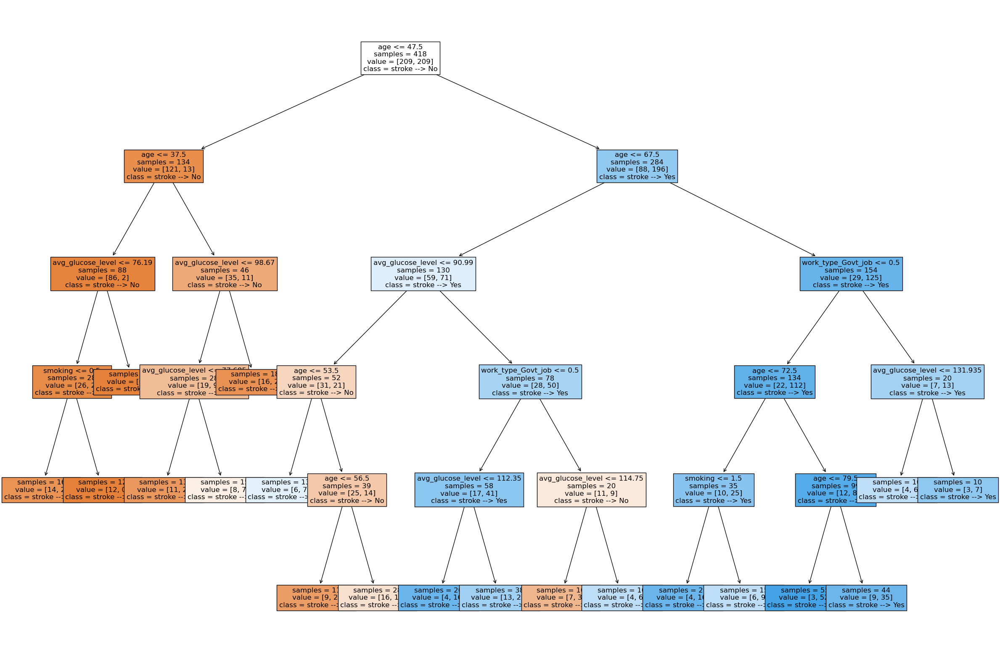

In [37]:
# Estructura del árbol creado
#-------------------------------------------------
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text

#-------------------------------------------------
sns.reset_defaults()
fig, ax = plt.subplots(figsize=(30,20))

print(f"Profundidad del árbol: {modelo.get_depth()}")
print(f"Número de nodos terminales: {modelo.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo,
            feature_names = X.columns,
            class_names = ["stroke --> No", "stroke --> Yes"],  # 0 es no y 1 es sí
            filled = True,
            impurity = False,
            fontsize = 12,
            ax = ax
            )

plt.show()




In [42]:
# Error de test de modelo
#-------------------------------------------------
predicciones = modelo.predict(X = X,)

print("Matriz de confusión")
print("-------------------")
skm.confusion_matrix(
            y,
            predicciones
)

Matriz de confusión
-------------------


array([[153,  56],
       [ 30, 179]], dtype=int64)

In [46]:
accuracy = skm.accuracy_score(
            y,
            predicciones,
            normalize = True
            )

print(f"El accuracy del test es: {100 * accuracy}%")

El accuracy del test es: 79.42583732057416%


## Podado del árbol de decisión

Aunque inicialmente se ha empleado un valor de max_depth = 5, este no tiene por qué ser el mejor valor. Con el objetivo de identificar la
profundidad óptima que consigue reducir la varianza y aumentar la capacidad predictiva del modelo, se somete al árbol a un proceso de pruning
(podado).

Se busca el valor mínimo del error de validación cruzada y ahí estará el valor de cp óptimo que se utilizará para recalcular el árbol con el
prunning.

Se utilizará el **árbol clasificador con condiciones por defecto**:

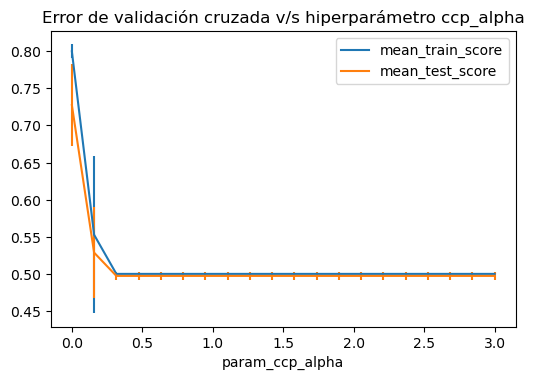

In [61]:
# Post prunning por validación cruzada
#--------------------------------------------------
from sklearn.model_selection import GridSearchCV

param_grid = {"ccp_alpha":np.linspace(0, 3, 20)} # ccp es coste de complejidad

# Búsqueda por validación cruzada
grid = GridSearchCV( #skm_s.GridSearchCV 
        # El árbol crece al máximo posible antes de aplicar el prunning
        estimator = sklearn.tree.DecisionTreeClassifier(
                                        max_depth = 5,
                                        min_samples_split = 2,
                                        min_samples_leaf = 10,
                                        random_state = 123
            ),
        param_grid = param_grid,
        scoring = "accuracy", # accuracy es poder de predicción
        cv = 10, # el modelo se entrena 10 veces
        refit = True,
        return_train_score = True
      )

# Gráfico de error de validación cruzada v/s parámetro (cual es el mejor parametro calculado)
#--------------------------------------------------------------------------------------------

grid.fit(X, y)

fig, ax = plt.subplots(figsize=(6, 3.84))
scores = pd.DataFrame(grid.cv_results_)
scores.plot(x="param_ccp_alpha", y="mean_train_score", yerr="std_train_score", ax=ax)
scores.plot(x="param_ccp_alpha", y="mean_test_score", yerr="std_test_score", ax=ax)
ax.set_title("Error de validación cruzada v/s hiperparámetro ccp_alpha")
plt.show()


In [54]:
# Mejor valor ccp_alpha encontrado
grid.best_params_

{'ccp_alpha': 0.0}

Una vez identificado el valor óptimo de ccp_alpha, se reentrena el árbol indicando este valor en sus argumentos. Si en el GridSearch()
se indica *refit = True*, este reentrenamiento se hace automáticamente y el modelo resultante se encuentra almacenado en *.best_estimator_*.

In [55]:
# Estructura del árbol final
#---------------------------------------------------
modelo_final = grid.best_estimator_
print(f"Profundidad del árbol: {modelo_final.get_depth()}")
print(f"Número de nodos terminales: {modelo_final.get_n_leaves()}")

Profundidad del árbol: 5
Número de nodos terminales: 19


In [58]:
# Error de test del modelo final
#---------------------------------------------------
predicciones_3 = modelo_final.predict(X = X)

accuracy_3 = skm.accuracy_score(
                y,
                predicciones_3,
                normalize = True
            )

print(f"El accuracy del test es: {100 * accuracy_3}%")

El accuracy del test es: 79.42583732057416%


Profundidad del árbol: 5
Número de nodos terminales: 19


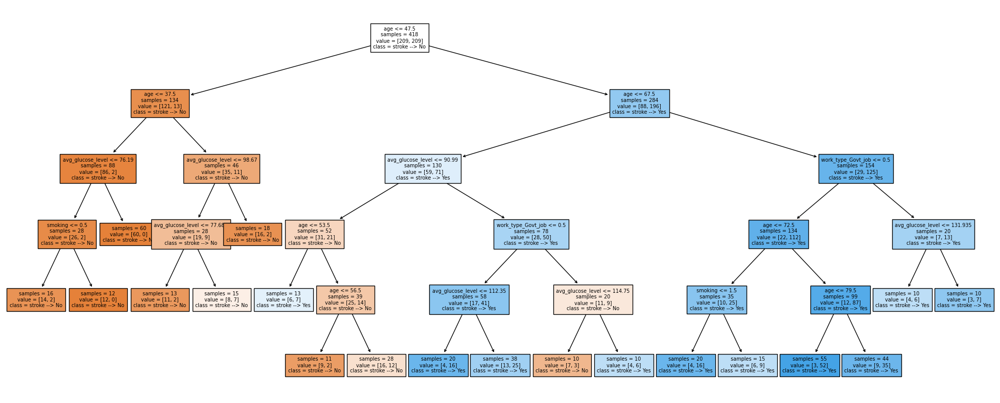

In [59]:
# Estructura del árbol creado
#-------------------------------------------------
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
from sklearn.tree import export_text

#-------------------------------------------------
sns.reset_defaults()
fig, ax = plt.subplots(figsize=(25,10))

print(f"Profundidad del árbol: {modelo_final.get_depth()}")
print(f"Número de nodos terminales: {modelo_final.get_n_leaves()}")

plot = plot_tree(
            decision_tree = modelo_final,
            feature_names = X.columns,
            class_names = ["stroke --> No", "stroke --> Yes"],  # 0 es no y 1 es sí
            filled = True,
            impurity = False,
            fontsize = 7,
            ax = ax
            )

plt.show()

# Training Clasificador

Por útltimo se entrena el clasificador siguiendo los siguientes pasos:

- Definir entradas - salidas según el feature selection (basándose en la selección manual del punto 6 balanceado).
- Data split
- Balancear los datos
- Definir las opciones de training
- Training con algoritmos básicos con los datos sin estandarizar
- Training con algoritmos básicos con los datos estandarizados
- Realizar predicciones con el modelo ganador

## Definir variables de entrada y salida

In [ ]:
# Seleccionamos las variable de entrada y salida según lo analizado en el punto 6.2:

# quitamos aquellas variables que no teníamos patrones:
var_x = [#'gender',
         'age',
         'hypertension',
         'heart_disease',
         #'ever_married',
         #'work_type',
         #'Residence_type',
         'avg_glucose_level',
         #'bmi',
         'smoking'
            ]
X = data[var_x]

y = data['stroke'] # variable de salida


# Dumizamos las variables objeto para poder usarlos en el modelo logístico:
var_x_object = [#'gender',            
                #'Residence_type',
                'hypertension',
                'heart_disease'
                #'ever_married'
                #'work_type'
                #'Residence_type',
                #'smoking_status'
               ]

X = pd.get_dummies(X, columns=var_x_object)

y = data['stroke'] # variable de salida

# Quitamos variables redundantes o con muy pocas muestras en los grupos de stroke:
var_x_drop = [#'gender_Male',
             #'gender_Other',
            #'Residence_type_Rural',
             'hypertension_0',
             #'ever_married_No'
             'heart_disease_0'
             #'work_type_children',
            #'work_type_Never_worked'
        
                ]

X = X.drop(columns = var_x_drop)
X.head()

## Data split

Los datos se separan en 80% y 20%:

In [ ]:
validation_size = 0.2 # proporción para validar
seed_partition = 70 # el número aleatorio
seed = 7

# X_train, X_validation, Y_train, Y_validation = train_test_split(X_Boruta, y, test_size=validation_size, random_state=seed)
X_train, X_validation, Y_train, Y_validation = train_test_split(X, y, test_size=validation_size, 
                                                                random_state=seed_partition)
# X_train, X_validation, Y_train, Y_validation = train_test_split(X, y, test_size=validation_size, random_state=seed)

## Balancear los datos

Este sistema ayuda a balancear el problema.

Para el proceso de balanceo hay varios tipos que se pueden aplicar. En este proceso se han implementado 5:

- 1 --> under sampling
- 2 --> over sampling
- 3 --> SMOTE (es under y over sampling)
- 4 --> SMOTE con corrección 1
- 5 --> SMOTE con corrección 2

In [ ]:
# Balaceamos los datos:

balanceo = True # le damos la opción de que si balancee los datos
tipo_balanceo=4 # el tipo de balanceo:

# = 1 --> under sampling
# = 2 --> over sampling
# = 3 --> SMOTE (es under y over sampling)
# = 4 --> SMOTE con corrección 1
# = 5 --> SMOTE con corrección 2

if balanceo:
    # Copio en un nuevo data frame los datos originiales para entrenar
    X_dum = X_train.copy()
    idx = X_train.index
    X_dum['idx'] = idx
    X_dum.head()

    Y_dum = Y_train.copy()
    
    # Balanceos:
    from imblearn.under_sampling import RandomUnderSampler
    from imblearn.over_sampling import RandomOverSampler
    from imblearn.over_sampling import SMOTE
    from imblearn.combine import SMOTEENN
    from imblearn.combine import SMOTETomek

    if tipo_balanceo==1:
        rus = RandomUnderSampler(random_state=0)
    if tipo_balanceo==2:
        rus = RandomOverSampler(random_state=0)    
    if tipo_balanceo==3:
        rus = SMOTE(random_state=0)
    if tipo_balanceo==4:
        rus = SMOTEENN(random_state=0)
    if tipo_balanceo==5:
        rus = SMOTETomek(random_state=0)

    #rus = RandomUnderSampler(random_state=0)
    X_b, y_b = rus.fit_resample(X_dum.drop(['idx'],axis=1), Y_dum)
    X_b.head()
    
    y_b_df = pd.DataFrame(y_b,columns=[var_y])

    # Barplot de la variable output- frecuencias absolutas
    sns.set_theme(style="whitegrid")
    ax = sns.countplot(x=var_y,data = y_b_df)
    plt.show()
    
    X_train = X_b.copy()
    Y_train = y_b.copy()

print('____________________________________')
print('Las variables de entrada son:')
X.head()

In [ ]:
# Visualizamos los datos de training:

Y_train_df = pd.DataFrame(Y_train,columns=['stroke'])

print('____________________________________')
print('DATOS DE TRAINING:')
# Barplot de la variable output- frecuencias absolutas
sns.set_theme(style="whitegrid")
ax = sns.countplot(x='stroke',data = Y_train_df)
plt.show()


Y_validation_df = pd.DataFrame(Y_validation,columns=['stroke'])


print('____________________________________')
print('DATOS DE VALIDACIÓN:')
# Barplot de la variable output- frecuencias absolutas
sns.set_theme(style="whitegrid")
ax = sns.countplot(x='stroke',data = Y_validation_df)
plt.show()

## Definir las opciones de training

In [ ]:
num_folds = 5
scoring = 'accuracy'

## Training con algoritmos básicos con los datos sin estandarizar

In [ ]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))

In [ ]:
results = []
names = []

# evaluamos los algoritmos basicos
for name, model in models:
    seed = 7
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('**************************************')
    print(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print('Predicción de Training:')
    print(msg)
    model.fit(X_train, Y_train) # fit del modelo
    # estimate accuracy on validation dataset
    print('Predicción de Validación:')
    predictions = model.predict(X_validation) # prediccion con los datos validacion
    print(accuracy_score(Y_validation, predictions))
    print(np.transpose(confusion_matrix(Y_validation, predictions)))
    print(classification_report(predictions,Y_validation))
    print('**************************************')

In [ ]:
# Comparamos algoritmos
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Training con algoritmos básicos con los datos estandarizados

In [ ]:
# Definimos el pipeline con estandarizacion y el modelo:
pipelines = []
pipelines.append(('ScaledLR', Pipeline([('Scaler', StandardScaler()),('LR', LogisticRegression(solver='liblinear'))])))
pipelines.append(('ScaledLDA', Pipeline([('Scaler', StandardScaler()),('LDA', LinearDiscriminantAnalysis())])))
pipelines.append(('ScaledKNN', Pipeline([('Scaler', StandardScaler()),('KNN', KNeighborsClassifier())])))
pipelines.append(('ScaledCART', Pipeline([('Scaler', StandardScaler()),('CART', DecisionTreeClassifier())])))
pipelines.append(('ScaledNB', Pipeline([('Scaler', StandardScaler()),('NB', GaussianNB())])))
pipelines.append(('ScaledSVM', Pipeline([('Scaler', StandardScaler()),('SVM', SVC(gamma='auto'))])))

In [ ]:
results = []
names = []

# evaluamos los algoritmos basicos
for name, model in pipelines:
    seed = 7
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('**************************************')
    print(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print('Predicción de Training:')
    print(msg)
    model.fit(X_train, Y_train) # fit del modelo
    # estimate accuracy on validation dataset
    print('Predicción de Validación:')
    predictions = model.predict(X_validation) # prediccion con los datos validacion
    print(accuracy_score(Y_validation, predictions))
    print(np.transpose(confusion_matrix(Y_validation, predictions)))
    print(classification_report(predictions,Y_validation))
    print('**************************************')

In [ ]:
# Comparamos algoritmos
fig = plt.figure()
fig.suptitle('Scaled Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Algoritmos avanzados estandarizando los datos

In [ ]:
# Definimos los algoritmos
ensembles = []
ensembles.append(('AB', AdaBoostClassifier()))
ensembles.append(('GBM', GradientBoostingClassifier()))
ensembles.append(('RF', RandomForestClassifier(n_estimators=10)))
ensembles.append(('ET', ExtraTreesClassifier(n_estimators=10)))

In [ ]:
results = []
names = []

# evaluamos los algoritmos basicos
for name, model in ensembles:
    seed = 7
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    print('**************************************')
    print(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print('Predicción de Training:')
    print(msg)
    model.fit(X_train, Y_train) # fit del modelo
    # estimate accuracy on validation dataset
    print('Predicción de Validación:')
    predictions = model.predict(X_validation) # prediccion con los datos validacion
    print(accuracy_score(Y_validation, predictions))
    print(np.transpose(confusion_matrix(Y_validation, predictions)))
    print(classification_report(predictions,Y_validation))
    print('**************************************')

## Modelo ganador:

Este es el momento donde se miran todos los datos tanto de training como los datos de validación.

El mejor algoritmo para datos de validación de stroke es el Naive Bayes con un 83% para stroke y un 71% de no stroke.

In [ ]:
models = []
models.append(('LR', LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(gamma='auto')))

name = models[4][0]
model = models[4][1]

seed = 7
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring=scoring)
results.append(cv_results)
names.append(name)
print('**************************************')
print(name)
msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
print('Predicción de Training:')
print(msg)
model.fit(X_train, Y_train) # fit del modelo
# estimate accuracy on validation dataset
print('Predicción de Validación:')
predictions = model.predict(X_validation) # prediccion con los datos validacion
print(accuracy_score(Y_validation, predictions))
print(np.transpose(confusion_matrix(Y_validation, predictions)))
print(classification_report(predictions,Y_validation))
print('**************************************')

El siguiente paso es probar con más variables y diferentes tipos de balanceos para poder seleccionar el mejor algoritmo teniendo en cuenta todas las posibilidades.

El training es un trabajo artesanal en los primeros momentos y una vez ya sabes cuál es el mejor algoritmo y vas teniendo más datos es cuestión de actualizarlo y optmizarlo.


# Predicciones con el modelo seleccionado y curva ROC

In [ ]:
predictions_prob = model.predict_proba(X_validation) # predicción probabilidades

df_validation = pd.DataFrame(Y_validation)
df_validation.columns = ['Real']
df_validation['Prob_NO_Stroke'] = predictions_prob[:,0]
df_validation['Prob_SI_stroke'] = predictions_prob[:,1]
df_validation['Prediccion'] = model.predict(X_validation)
df_validation['Error'] = abs(df_validation['Real']-df_validation['Prediccion'])
df_validation['Diff_Abs'] = abs(df_validation['Prob_NO_Stroke']-df_validation['Prob_SI_stroke'])


# roc curve and auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

Y_validation_mod  = Y_validation
ns_probs = [0 for _ in range(len(Y_validation_mod))]
# predict probabilities
lr_probs = predictions_prob
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 1]
# calculate scores
ns_auc = roc_auc_score(Y_validation_mod, ns_probs)
lr_auc = roc_auc_score(Y_validation_mod, lr_probs)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Model: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = roc_curve(Y_validation_mod, ns_probs)
lr_fpr, lr_tpr, thresholds = roc_curve(Y_validation_mod, lr_probs)
# plot the roc curve for the model
pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Model')
# axis labels
pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

In [ ]:
# Puedes ver el resultados de los primeros 30 pacientes real, prediccióm y las probabilidades que nos da el algoritmo:
df_validation.head(30)